In [1]:
import torch
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from transformers import ViTForImageClassification, AutoProcessor
from pathlib import Path
import os

import sys; sys.path.append("../src/")
from stability import soft_stability_rate
from models import MaskedImageClassifier, CertifiedMuSImageClassifier, discretized_mus_masks
from data_utils import load_images_from_directory
from explanations import \
    get_lime_for_image, get_shap_for_image, get_intgrad_for_image, get_mfaba_for_image
from visualizations import add_k_ones_enumerate, vis_masked_img, get_top_k_predictions, get_labels_containing_keyword
from visualizations import set_random_seed, MaskedImageClassifierNew, CertifiedMuSImageClassifierNew

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
# Load images; they will be ordered the same every time.
images = load_images_from_directory("/shared_data0/helenjin/imagenet-sample-images/")
# images = images[:20]
print(images.shape)

torch.Size([1000, 3, 224, 224])


In [3]:
# Load the model. This should be our custom fine-tuned models later!
raw_vit = ViTForImageClassification.from_pretrained("google/vit-base-patch16-224")
raw_vit.eval().to(device);
processor = AutoProcessor.from_pretrained('google/vit-base-patch16-224')

In [4]:
# raw_vit.load_state_dict(torch.load('/shared_data0/antonxue/google_vit_patch16_img224_bsz128_lr0.0001_epoch5.pt')['state_dict'])

In [5]:
images.min(), images.max()

(tensor(-1.), tensor(1.))

In [6]:
# torch.tensor(processor(images[0])['pixel_values']).min(), torch.tensor(processor(images[0])['pixel_values']).max()

In [7]:
import torch
from torchvision.transforms import ToPILImage

# Example tensor (C, H, W) in range [0, 1]
tensor = torch.rand(3, 256, 256)  # Example RGB image

# Convert to PIL image
to_pil = ToPILImage()
pil_image = to_pil(tensor)

# Show image
# pil_image.show()


image_proc = torch.tensor(processor(to_pil(images[0]))['pixel_values'])

In [8]:
image_proc.min(), image_proc.max()

(tensor(-1.), tensor(0.9922))

In [9]:
images.min(), images.max()

(tensor(-1.), tensor(1.))

In [10]:
grid_size = 7

In [11]:
wrapped_vit = MaskedImageClassifierNew(raw_vit, grid_size=(grid_size,grid_size)).to(device)
wrapped_vit.eval();
cert_mus_vit = CertifiedMuSImageClassifierNew(raw_vit, lambda_=0.5, 
                                              grid_size=(grid_size,grid_size),
                                             quant=256).to(device)
cert_mus_vit.eval();

In [12]:
wrapped_vit.grid_size

(7, 7)

In [13]:
# cand_idxs = [150, 3, 11, 14, 17, 19, 93, 112,157,169,174, 194]

In [14]:
def check_pred_same(wrapped_vit, cert_mus_vit, image, label, alpha=None): # label = img_idx
    wrapped_vit_pred = wrapped_vit(image.to(device), alpha).argmax(-1).item()
    cert_mus_vit_pred = cert_mus_vit(image.to(device), alpha)['logits'].argmax(-1).item()
    # print('wrapped_vit_pred', wrapped_vit_pred, 'cert_mus_vit_pred', cert_mus_vit_pred)

    if wrapped_vit_pred != cert_mus_vit_pred or wrapped_vit_pred != label or cert_mus_vit_pred != label:
        # print('cont')
        return False
    return True

## Trash

In [1229]:
import torch

def get_sorted_indices_by_logit_gap(model, images, k=10):
    """
    Loops through all images in a batch, computes the gap between the top-1 and top-2 logits,
    and returns a list of indices sorted in descending order based on the gap.

    Args:
        model: The vision transformer model.
        images (torch.Tensor): A batch of images (batch_size, C, H, W).
        k (int): The number of top-k predictions to retrieve.

    Returns:
        list: Indices of images sorted by the logit gap (top1 - top2).
    """
    logit_gaps = []
    
    for idx, img in enumerate(images):
        img = img.unsqueeze(0).cuda()  # Add batch dimension and move to GPU if necessary
        logits = model(img).squeeze(0)  # Get model logits
        
        # Get top-k predictions
        top_k_logits, top_k_indices = torch.topk(logits, k)
        
        # Compute the gap between top-1 and top-2 logits
        logit_gap = top_k_logits[0] - top_k_logits[1]
        logit_gaps.append((idx, logit_gap.item()))
    
    # Sort by logit gap in descending order
    sorted_indices = [idx for idx, _ in sorted(logit_gaps, key=lambda x: x[1], reverse=True)]
    
    return sorted_indices

sorted_indices = get_sorted_indices_by_logit_gap(wrapped_vit, images)
print("Sorted indices based on logit gap:", sorted_indices)


KeyboardInterrupt: 

In [ ]:
import torch
from tqdm.auto import tqdm

def find_image_with_different_prediction(images, wrapped_vit, cert_mus_vit, device, k_range=(1, 3),
                                        num_patches=49, top_k_frac=0.25, sorted_indices=None):
    """
    Loops through a batch of images and finds one where at least one different prediction
    occurs for varying values of k.

    Args:
        images (torch.Tensor): A batch of images (batch_size, C, H, W).
        wrapped_vit: The first vision transformer model.
        cert_mus_vit: The second vision transformer model.
        alpha (torch.Tensor): The alpha values used for modification.
        device: The device to run computations on (e.g., "cuda" or "cpu").
        k_range (tuple): Range of k values to test (default: (1,6)).

    Returns:
        int: The index of the image that satisfies the condition, or -1 if none found.
    """
    if sorted_indices is None:
        sorted_indices = list(range(images))
        
    use = []
    print('sorted_indices', sorted_indices)
    # for img_idx, img in tqdm(enumerate(images), total=len(images)):
    for img_idx in tqdm(sorted_indices):
        print('img_idx', img_idx)
        img = images[img_idx]
        img = img.unsqueeze(0).to(device)  # Add batch dimension and move to device
        # print(f'Checking image {img_idx}')
        
        # want the image to be better
        
        set_random_seed(42)
        shap_expln_alpha, shap_expln, shap_expln_attrs = get_shap_for_image(wrapped_vit, 
                                                                        img[0], return_verbose=True,
                                                                        num_patches=num_patches, 
                                                                        top_k_frac=top_k_frac)
        
        # get stabilities
        exp = shap_expln_alpha
        alpha = shap_expln_alpha
        set_random_seed(42)
        ss_list = []
        # print('exp', exp.shape)
        # print('wrapped_vit', wrapped_vit.grid_size)
        for r in range(*k_range):
            ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
            ss_list.append(ss)
        print('soft stability', ss_list)
        hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
        print('hard stability radius', hs_radius)
        
        print('hs_radius < 1', hs_radius < 1)
        if hs_radius < 1: # only want at least one for hs_radius
            print('hi')
            continue
            
        wrapped_vit_pred = wrapped_vit(image.to(device), alpha.to(device)).argmax(-1).item()
        cert_mus_vit_pred = cert_mus_vit(image.to(device), alpha.to(device))['logits'].argmax(-1).item()
        print('wrapped_vit_pred', wrapped_vit_pred, 'cert_mus_vit_pred', cert_mus_vit_pred)
        
        if wrapped_vit_pred != cert_mus_vit_pred or wrapped_vit_pred != img_idx or cert_mus_vit_pred != img_idx:
            print('cont')
            continue

        # vis_masked_img(image=image.cpu(), alpha=shap_expln_alpha.cpu()) 
        alpha = shap_expln_alpha
        
        wrapped_preds = []
        cert_preds = []
        
        # want to have at least one error case
        # Iterate over k values
        print('hello')
        for k in range(*k_range):
            # print(f'Checking image {img_idx}, k={k}')
            try:
                alpha_add_k = add_k_ones_enumerate(alpha, k=k)
            except:
                alpha_add_k = torch.ones_like(alpha)

            # Iterate over different alpha_add variations
            prev_preds = None  # Store previous predictions for comparison
            for i, alpha_add in tqdm(enumerate(alpha_add_k), total=len(alpha_add_k)):
                wrapped_pred = wrapped_vit(img, alpha_add.to(device)).argmax(-1).item()
                cert_pred = cert_mus_vit(img, alpha_add.to(device))['logits'].argmax(-1).item()
                
                # print(f"Image {img_idx}, k={k}, i={i}: wrapped_vit={wrapped_pred}, cert_mus_vit={cert_pred}")
                
                # Compare predictions
                if prev_preds is not None and (wrapped_pred != prev_preds[0] or cert_pred != prev_preds[1]):
                    print(f"Found image {img_idx} where predictions differ at k={k}, i={i}")
                    # return img_idx  # Return the first image index where a difference is found
                
                prev_preds = (wrapped_pred, cert_pred)  # Store previous predictions
                # print('prev_preds', prev_preds)
                wrapped_preds.append(wrapped_pred)
                cert_preds.append(cert_pred)
                if len(set(wrapped_preds)) > 1 and len(set(cert_preds)) > 1: # at least one error case
                    use.append(img_idx)
                    print('use')
                    print(img_idx)
                    print('soft stability', ss_list)
                    print('hard stability radius', hs_radius)
                    break
            if len(set(wrapped_preds)) > 1 and len(set(cert_preds)) > 1: # at least one error case
                    # use.append(img_idx)
                    # print('use')
                    # print(img_idx)
                    # print('soft stability', ss_list)
                    # print('hard stability radius', hs_radius)
                break
            
        
    return use  # Return -1 if no image satisfies the condition

cert_shap_stability_idxs = [530, 916, 574, 985, 459, 945, 733, 644, 463, 950, 789, 952, 685, 680,
        294, 719, 597, 486, 466, 913, 902, 397, 748, 725, 447, 984, 723, 928,
        933, 978, 886, 250, 543, 649, 958, 409, 500, 989, 798, 147, 630, 814,
        320, 112, 111, 308, 495, 688, 248, 765, 339, 778, 338, 678, 479, 558,
        465, 402, 662, 781, 175, 313, 660, 992, 585, 736, 227, 892, 731,  76,
        228, 102, 659, 668, 271, 333, 276, 136, 108, 940, 245, 701, 639, 507,
        449, 153, 125, 280, 171, 708, 523, 800, 605, 525, 846, 604, 433, 429,
        347, 732, 545, 785, 514, 915,  28, 855,  61,  70, 106, 445, 712, 613,
        167, 973, 931, 261, 614, 301, 752, 867, 942, 998, 744, 150, 749, 862,
         13, 101, 539, 865, 621, 858, 200, 929, 487, 920, 909, 584, 251, 357,
        569, 340, 417, 506, 216, 183, 453, 691, 955,   3, 631, 375, 767, 618,
        542, 233, 292,  58, 714, 611, 599, 226, 124, 583, 687,  24, 657, 981,
        319, 568,  81, 908, 450, 896, 629, 368, 351, 768, 481,  38, 580, 555,
        330, 145, 972, 371, 413,   6,   8, 876, 949, 509, 957, 924, 808,  55,
        113, 969, 788, 419, 443, 718,   2, 146, 927, 307, 471, 472, 473, 217,
        323, 380, 223, 760, 724, 829, 841, 117, 860, 970, 560, 635, 986, 516,
        334, 740, 938, 830, 283, 888, 158,  88, 461, 783,  79,  26, 923, 395,
        796, 756, 430, 763, 564, 211, 848, 566, 114, 932, 263, 141, 623, 502,
         15, 603, 773, 681, 670, 974, 166, 391, 440, 214, 930, 633, 591, 787,
        356, 956, 498, 947, 364, 802, 386, 381, 156, 154, 910, 372, 683, 221,
        367, 427, 552, 751, 455, 832, 304, 238,   5, 847, 451, 994, 235, 554,
        871, 318, 557, 852, 460, 912,  90, 654, 656, 811, 786, 133, 819, 157,
        737, 658,  53, 100, 777,   0, 324, 628, 627, 328, 673, 378, 510, 385,
        600, 753, 207, 224, 189, 845, 229, 894, 165, 816, 790, 281, 198, 199,
        104,  14, 944, 265,  12, 176, 891, 273,  78, 826, 266, 206, 129, 416,
        155, 405, 310, 195, 818, 587, 399, 188, 625, 312, 619, 776, 231, 990,
         65, 546, 874,  46, 963, 965, 247, 404, 321, 389, 314, 337, 739,  72,
        414, 774, 110,  94, 559,  18, 741, 480, 309, 332, 578, 699, 363, 610,
        130, 369, 300, 132, 586, 220, 914,  40, 194, 197, 602, 899,  56, 148,
        144, 911, 606,  36,  60,  64, 922, 118, 489, 953, 497,  80, 551, 315,
        769, 335, 775, 288, 287, 282, 259, 730, 983, 727, 252, 549, 823, 541,
        411, 212, 743, 728, 709, 140, 655, 256, 257, 609, 684, 366,  59, 478,
        218, 355,  34, 424,  66, 954, 508, 343, 342, 939, 771, 336, 412, 951,
        948, 906, 400,  44, 979, 392, 879, 883, 964, 837, 885, 526, 887,  31,
        834, 448, 239, 582, 907,  42, 696, 159, 904,  54, 905, 976,   4, 997,
        661, 544, 575,  35, 579, 576,  51,  23,  57, 593,  21, 533, 388, 674,
        870, 682, 869, 203, 415, 856, 702, 222, 840, 835, 496, 242, 253, 370,
        797, 284, 784, 291, 303, 770, 757, 758, 468, 122, 643, 178, 648, 476,
        119, 925, 474, 653, 161, 934, 456, 454,  91, 897,  89, 577, 960, 755,
        745, 620, 988, 795, 946, 804,   1, 729, 615, 982, 726, 919, 715, 713,
        918, 686, 868, 962, 594, 875, 878, 667, 664, 174,  17,  19, 274,  68,
         69, 504,  27, 505, 162, 135,  95, 185, 262, 442,  85, 299, 517,  83,
        322, 317, 358, 376, 379, 556, 383, 477, 115, 163, 172, 494, 536, 645,
        186, 244, 642, 877, 302, 182, 641, 828, 329, 327,  67, 697, 126, 295,
        782, 116, 396, 105, 747, 707, 705, 349, 143, 695, 270, 142, 422, 268,
        267, 345, 810, 260, 499, 843, 588, 616, 993, 537, 191, 634, 219, 503,
         25, 839, 225,  29, 977,  45, 190, 236,  22, 492, 565, 590, 237, 208,
         48, 520, 326,  20, 205, 152, 850, 403, 710, 547, 540, 935, 706, 589,
         99, 703,  98, 535, 421, 120, 354, 742, 861, 898, 734, 362, 365, 373,
        374, 209, 394, 853, 567,  11, 169, 721, 720, 109, 393, 991, 350, 246,
        987, 980, 258, 762, 192, 446, 254,  73, 331, 501, 438, 824,  63, 187,
        483, 833, 243, 637, 831,  50, 521, 139, 596, 693, 692, 420, 689, 864,
        423, 799, 305, 671, 264, 805, 676,  92, 607, 608, 813, 297, 311, 903,
        815, 859, 210, 851, 213, 196, 193, 232, 240, 241, 825, 821, 820, 900,
        204, 177, 803, 889, 272, 793, 792, 791, 278, 893, 895, 164, 452, 484,
         62, 647, 650, 651, 652, 470, 467,  74, 961, 444,  75,  77, 441,  84,
        943, 675, 677, 524, 999,   9, 996, 562, 561, 550,  16, 528, 527, 766,
         41, 513, 971, 617, 511, 622, 967, 488, 700, 735, 123, 128, 722, 352,
        134, 716, 398, 401, 344, 103, 759, 761, 936, 418, 679, 316, 434, 151,
        325, 432, 426, 690, 694, 995,  10, 149, 917,  30,  37, 966, 863, 121,
        289, 173, 884, 882,  87, 880,  96, 937,  71, 890,  97, 168, 959,  52,
        107,  93, 968, 873, 872,  47, 926, 407, 462, 458, 663, 665, 439, 672,
        437, 436, 431, 698, 410, 408, 469, 704, 406, 857, 390, 387, 384, 382,
        377, 361, 360, 359, 348, 519, 570, 571, 573, 563, 553, 581, 538, 534,
        532, 531, 598, 601, 711, 518, 515, 512, 493, 490, 632, 636, 638, 640,
        482, 646, 475, 234, 842, 780, 293, 290, 230, 807, 286, 838, 779, 285,
        279, 806, 827, 801, 822, 794, 269, 298, 854, 849, 817, 215, 346, 809,
        341, 764, 306, 844, 772, 296, 249,  43,  39, 624, 491, 975, 626, 184,
        202, 612,  33,  32, 522, 836, 529, 595, 592, 548, 866, 201, 572,   7,
        137, 921, 941, 435, 428, 425, 901, 717, 160, 754, 170, 738, 127, 750,
        353, 131, 746, 138, 255,  86, 669, 277, 666,  82, 275, 457, 464, 179,
        180, 181, 881, 485,  49, 812]



image_idxs = find_image_with_different_prediction(images, wrapped_vit, 
                                                 cert_mus_vit, device,
                                                sorted_indices=[459])
if image_idx != -1:
    print(f"Found an image at index {image_idxs} with different predictions.")
else:
    print("No image found where predictions differ.")


In [ ]:
import torch
from tqdm.auto import tqdm

def find_image_with_different_prediction(images, wrapped_vit, cert_mus_vit, device, k_range=(1, 3),
                                        num_patches=49, top_k_frac=0.25, sorted_indices=None):
    """
    Loops through a batch of images and finds one where at least one different prediction
    occurs for varying values of k.

    Args:
        images (torch.Tensor): A batch of images (batch_size, C, H, W).
        wrapped_vit: The first vision transformer model.
        cert_mus_vit: The second vision transformer model.
        alpha (torch.Tensor): The alpha values used for modification.
        device: The device to run computations on (e.g., "cuda" or "cpu").
        k_range (tuple): Range of k values to test (default: (1,6)).

    Returns:
        int: The index of the image that satisfies the condition, or -1 if none found.
    """
    if sorted_indices is None:
        sorted_indices = list(range(images))
        
    use = []
    
    # for img_idx, img in tqdm(enumerate(images), total=len(images)):
    for img_idx in tqdm(sorted_indices):
        print('img_idx', img_idx)
        img = images[img_idx]
        image = img
        img = img.unsqueeze(0).to(device)  # Add batch dimension and move to device
        # print(f'Checking image {img_idx}')
        
        # want the image to be better
        
        set_random_seed(42)
        shap_expln_alpha, shap_expln, shap_expln_attrs = get_shap_for_image(wrapped_vit, 
                                                                        img[0], return_verbose=True,
                                                                        num_patches=num_patches, 
                                                                        top_k_frac=top_k_frac)
        
        # get stabilities
        exp = shap_expln_alpha
        alpha = shap_expln_alpha
        set_random_seed(42)
        ss_list = []
        # print('exp', exp.shape)
        # print('wrapped_vit', wrapped_vit.grid_size)
        for r in range(*k_range):
            ss = soft_stability_rate(wrapped_vit, img[0].to(device), exp.to(device), r, epsilon=0.1).item()
            ss_list.append(ss)
        print('soft stability', ss_list)
        hs_radius = cert_mus_vit(img.to(device), alpha=exp.to(device))["cert_rs"]
        print('hard stability radius', hs_radius)
        
        if hs_radius < 1: # only want at least one for hs_radius
            print('hi')
            continue
            
        wrapped_vit_pred = wrapped_vit(img.to(device), alpha.to(device)).argmax(-1).item()
        cert_mus_vit_pred = cert_mus_vit(img.to(device), alpha.to(device))['logits'].argmax(-1).item()
        print('wrapped_vit_pred', wrapped_vit_pred, 'cert_mus_vit_pred', cert_mus_vit_pred)
        
        if wrapped_vit_pred != cert_mus_vit_pred or wrapped_vit_pred != img_idx or cert_mus_vit_pred != img_idx:
            print('cont')
            continue
            
        if min(ss_list) < 1:
            print('---- USE ----')
            use.append(img_idx)
            
        
    return use  # Return -1 if no image satisfies the condition



image_idxs = find_image_with_different_prediction(images, wrapped_vit, 
                                                 cert_mus_vit, device,
                                                  num_patches=49,
                                                sorted_indices=cert_shap_stability_idxs[5:],
                                                 k_range=(2,10))
if image_idx != -1:
    print(f"Found an image at index {image_idx} with different predictions.")
else:
    print("No image found where predictions differ.")


In [ ]:

cert_shap_stability_idxs = torch.LongTensor([530, 916, 574, 985, 459, 945, 733, 644, 463, 950, 789, 952, 685, 680,
        294, 719, 597, 486, 466, 913, 902, 397, 748, 725, 447, 984, 723, 928,
        933, 978, 886, 250, 543, 649, 958, 409, 500, 989, 798, 147, 630, 814,
        320, 112, 111, 308, 495, 688, 248, 765, 339, 778, 338, 678, 479, 558,
        465, 402, 662, 781, 175, 313, 660, 992, 585, 736, 227, 892, 731,  76,
        228, 102, 659, 668, 271, 333, 276, 136, 108, 940, 245, 701, 639, 507,
        449, 153, 125, 280, 171, 708, 523, 800, 605, 525, 846, 604, 433, 429,
        347, 732, 545, 785, 514, 915,  28, 855,  61,  70, 106, 445, 712, 613,
        167, 973, 931, 261, 614, 301, 752, 867, 942, 998, 744, 150, 749, 862,
         13, 101, 539, 865, 621, 858, 200, 929, 487, 920, 909, 584, 251, 357,
        569, 340, 417, 506, 216, 183, 453, 691, 955,   3, 631, 375, 767, 618,
        542, 233, 292,  58, 714, 611, 599, 226, 124, 583, 687,  24, 657, 981,
        319, 568,  81, 908, 450, 896, 629, 368, 351, 768, 481,  38, 580, 555,
        330, 145, 972, 371, 413,   6,   8, 876, 949, 509, 957, 924, 808,  55,
        113, 969, 788, 419, 443, 718,   2, 146, 927, 307, 471, 472, 473, 217,
        323, 380, 223, 760, 724, 829, 841, 117, 860, 970, 560, 635, 986, 516,
        334, 740, 938, 830, 283, 888, 158,  88, 461, 783,  79,  26, 923, 395,
        796, 756, 430, 763, 564, 211, 848, 566, 114, 932, 263, 141, 623, 502,
         15, 603, 773, 681, 670, 974, 166, 391, 440, 214, 930, 633, 591, 787,
        356, 956, 498, 947, 364, 802, 386, 381, 156, 154, 910, 372, 683, 221,
        367, 427, 552, 751, 455, 832, 304, 238,   5, 847, 451, 994, 235, 554,
        871, 318, 557, 852, 460, 912,  90, 654, 656, 811, 786, 133, 819, 157,
        737, 658,  53, 100, 777,   0, 324, 628, 627, 328, 673, 378, 510, 385,
        600, 753, 207, 224, 189, 845, 229, 894, 165, 816, 790, 281, 198, 199,
        104,  14, 944, 265,  12, 176, 891, 273,  78, 826, 266, 206, 129, 416,
        155, 405, 310, 195, 818, 587, 399, 188, 625, 312, 619, 776, 231, 990,
         65, 546, 874,  46, 963, 965, 247, 404, 321, 389, 314, 337, 739,  72,
        414, 774, 110,  94, 559,  18, 741, 480, 309, 332, 578, 699, 363, 610,
        130, 369, 300, 132, 586, 220, 914,  40, 194, 197, 602, 899,  56, 148,
        144, 911, 606,  36,  60,  64, 922, 118, 489, 953, 497,  80, 551, 315,
        769, 335, 775, 288, 287, 282, 259, 730, 983, 727, 252, 549, 823, 541,
        411, 212, 743, 728, 709, 140, 655, 256, 257, 609, 684, 366,  59, 478,
        218, 355,  34, 424,  66, 954, 508, 343, 342, 939, 771, 336, 412, 951,
        948, 906, 400,  44, 979, 392, 879, 883, 964, 837, 885, 526, 887,  31,
        834, 448, 239, 582, 907,  42, 696, 159, 904,  54, 905, 976,   4, 997,
        661, 544, 575,  35, 579, 576,  51,  23,  57, 593,  21, 533, 388, 674,
        870, 682, 869, 203, 415, 856, 702, 222, 840, 835, 496, 242, 253, 370,
        797, 284, 784, 291, 303, 770, 757, 758, 468, 122, 643, 178, 648, 476,
        119, 925, 474, 653, 161, 934, 456, 454,  91, 897,  89, 577, 960, 755,
        745, 620, 988, 795, 946, 804,   1, 729, 615, 982, 726, 919, 715, 713,
        918, 686, 868, 962, 594, 875, 878, 667, 664, 174,  17,  19, 274,  68,
         69, 504,  27, 505, 162, 135,  95, 185, 262, 442,  85, 299, 517,  83,
        322, 317, 358, 376, 379, 556, 383, 477, 115, 163, 172, 494, 536, 645,
        186, 244, 642, 877, 302, 182, 641, 828, 329, 327,  67, 697, 126, 295,
        782, 116, 396, 105, 747, 707, 705, 349, 143, 695, 270, 142, 422, 268,
        267, 345, 810, 260, 499, 843, 588, 616, 993, 537, 191, 634, 219, 503,
         25, 839, 225,  29, 977,  45, 190, 236,  22, 492, 565, 590, 237, 208,
         48, 520, 326,  20, 205, 152, 850, 403, 710, 547, 540, 935, 706, 589,
         99, 703,  98, 535, 421, 120, 354, 742, 861, 898, 734, 362, 365, 373,
        374, 209, 394, 853, 567,  11, 169, 721, 720, 109, 393, 991, 350, 246,
        987, 980, 258, 762, 192, 446, 254,  73, 331, 501, 438, 824,  63, 187,
        483, 833, 243, 637, 831,  50, 521, 139, 596, 693, 692, 420, 689, 864,
        423, 799, 305, 671, 264, 805, 676,  92, 607, 608, 813, 297, 311, 903,
        815, 859, 210, 851, 213, 196, 193, 232, 240, 241, 825, 821, 820, 900,
        204, 177, 803, 889, 272, 793, 792, 791, 278, 893, 895, 164, 452, 484,
         62, 647, 650, 651, 652, 470, 467,  74, 961, 444,  75,  77, 441,  84,
        943, 675, 677, 524, 999,   9, 996, 562, 561, 550,  16, 528, 527, 766,
         41, 513, 971, 617, 511, 622, 967, 488, 700, 735, 123, 128, 722, 352,
        134, 716, 398, 401, 344, 103, 759, 761, 936, 418, 679, 316, 434, 151,
        325, 432, 426, 690, 694, 995,  10, 149, 917,  30,  37, 966, 863, 121,
        289, 173, 884, 882,  87, 880,  96, 937,  71, 890,  97, 168, 959,  52,
        107,  93, 968, 873, 872,  47, 926, 407, 462, 458, 663, 665, 439, 672,
        437, 436, 431, 698, 410, 408, 469, 704, 406, 857, 390, 387, 384, 382,
        377, 361, 360, 359, 348, 519, 570, 571, 573, 563, 553, 581, 538, 534,
        532, 531, 598, 601, 711, 518, 515, 512, 493, 490, 632, 636, 638, 640,
        482, 646, 475, 234, 842, 780, 293, 290, 230, 807, 286, 838, 779, 285,
        279, 806, 827, 801, 822, 794, 269, 298, 854, 849, 817, 215, 346, 809,
        341, 764, 306, 844, 772, 296, 249,  43,  39, 624, 491, 975, 626, 184,
        202, 612,  33,  32, 522, 836, 529, 595, 592, 548, 866, 201, 572,   7,
        137, 921, 941, 435, 428, 425, 901, 717, 160, 754, 170, 738, 127, 750,
        353, 131, 746, 138, 255,  86, 669, 277, 666,  82, 275, 457, 464, 179,
        180, 181, 881, 485,  49, 812])

non_one_soft_stabilities = torch.LongTensor([  4,   7,  17,  19,  23,  29,  31,  36,  42,  45,  46,  48,  50,  51,
         57,  58,  60,  62,  63,  65,  66,  67,  72,  80,  82,  84,  86,  88,
         90,  91,  96,  98, 100, 101, 103, 105, 106, 109, 111, 112, 113, 114,
        116, 118, 119, 121, 122, 126, 128, 129, 130, 131, 132, 134, 136, 137,
        140, 146, 147, 148, 150, 151, 155, 157, 158, 160, 162, 163, 166, 167,
        168, 169, 173, 175, 176, 177, 180, 188, 189, 191, 193, 198, 199, 205,
        207, 209, 211, 212, 213, 216, 218, 219, 224, 225, 230, 232, 236, 237,
        238, 241, 242, 244, 245, 250, 251, 254, 255, 256, 258, 260, 263, 266,
        269, 270, 274, 276, 278, 280, 281, 285, 286, 287, 289, 290, 292, 294,
        298, 299, 301, 302, 304, 306, 309, 318, 319, 321, 323, 324, 326, 330,
        333, 336, 338, 341, 342, 346, 355, 356, 362, 364, 366, 367, 376, 377,
        378, 380, 382, 390, 394, 399, 401, 402, 403, 404, 407, 409, 411, 412,
        414, 416, 419, 421, 423, 425, 427, 428, 429, 430, 431, 432, 435, 436,
        440, 443, 445, 448, 450, 451, 452, 453, 454, 456, 460, 462, 463, 464,
        465, 466, 469, 471, 472, 473, 474, 475, 479, 482, 483, 484, 487, 488,
        489, 490, 491, 493, 495, 497, 498, 499, 500, 501, 504, 506, 508, 509,
        510, 513, 518, 521, 525, 527, 528, 530, 531, 532, 534, 535, 536, 537,
        538, 539, 540, 543, 544, 546, 547, 548, 550, 553, 555, 556, 557, 559,
        561, 563, 564, 566, 567, 568, 569, 573, 577, 578, 581, 582, 583, 584,
        586, 589, 590, 592, 593, 594, 595, 596, 597, 598, 599, 600, 607, 608,
        610, 612, 615, 616, 617, 619, 621, 623, 625, 629, 630, 632, 633, 637,
        640, 641, 642, 645, 648, 649, 650, 651, 653, 655, 657, 658, 659, 660,
        662, 664, 666, 667, 669, 670, 673, 674, 676, 680, 681, 682, 684, 685,
        687, 689, 690, 691, 693, 694, 696, 697, 700, 703, 704, 707, 708, 709,
        711, 714, 719, 720, 723, 724, 726, 727, 729, 732, 733, 737, 738, 741,
        742, 744, 745, 746, 747, 748, 751, 753, 754, 756, 757, 759, 760, 764,
        765, 766, 767, 770, 771, 772, 773, 774, 776, 777, 778, 779, 780, 781,
        784, 786, 787, 795, 796, 798, 800, 801, 802, 804, 805, 806, 807, 808,
        810, 811, 813, 814, 815, 819, 822, 824, 828, 829, 832, 834, 837, 839,
        842, 845, 851, 852, 853, 854, 856, 857, 858, 860, 862, 863, 864, 865,
        867, 869, 870, 871, 872, 873, 875, 876, 877, 878, 880, 882, 883, 884,
        885, 889, 891, 892, 893, 894, 895, 897, 898, 901, 904, 907, 908, 909,
        910, 911, 913, 914, 915, 916, 918, 919, 920, 921, 923, 924, 925, 933,
        934, 935, 936, 939, 940, 941, 943, 944, 945, 949, 950, 951, 952, 954,
        958, 959, 961, 966, 967, 968, 969, 975, 977, 979, 986, 987, 991, 994,
        996, 997, 998])

In [ ]:
import torch
from tqdm.auto import tqdm

def find_image_with_different_prediction(images, wrapped_vit, cert_mus_vit, device, k_range=(1, 3),
                                        num_patches=49, top_k_frac=0.25, sorted_indices=None):
    """
    Loops through a batch of images and finds one where at least one different prediction
    occurs for varying values of k.

    Args:
        images (torch.Tensor): A batch of images (batch_size, C, H, W).
        wrapped_vit: The first vision transformer model.
        cert_mus_vit: The second vision transformer model.
        alpha (torch.Tensor): The alpha values used for modification.
        device: The device to run computations on (e.g., "cuda" or "cpu").
        k_range (tuple): Range of k values to test (default: (1,6)).

    Returns:
        int: The index of the image that satisfies the condition, or -1 if none found.
    """
    if sorted_indices is None:
        sorted_indices = list(range(images))
        
    use = []
    
    # for img_idx, img in tqdm(enumerate(images), total=len(images)):
    for img_idx in tqdm(sorted_indices):
        # print('img_idx', img_idx)
        img = images[img_idx]
        image = img
        img = img.unsqueeze(0).to(device)  # Add batch dimension and move to device
        # print(f'Checking image {img_idx}')
        
        # want the image to be better
        
        set_random_seed(42)
#         shap_expln_alpha, shap_expln, shap_expln_attrs = get_shap_for_image(wrapped_vit, 
#                                                                         img[0], return_verbose=True,
#                                                                         num_patches=num_patches, 
#                                                                         top_k_frac=top_k_frac)
        
#         # get stabilities
#         exp = shap_expln_alpha
#         alpha = shap_expln_alpha
#         set_random_seed(42)
#         ss_list = []
#         # print('exp', exp.shape)
#         # print('wrapped_vit', wrapped_vit.grid_size)
#         for r in range(*k_range):
#             ss = soft_stability_rate(wrapped_vit, img[0].to(device), exp.to(device), r, epsilon=0.1).item()
#             ss_list.append(ss)
#         print('soft stability', ss_list)
#         hs_radius = cert_mus_vit(img.to(device), alpha=exp.to(device))["cert_rs"]
#         print('hard stability radius', hs_radius)
        
#         if hs_radius < 1: # only want at least one for hs_radius
#             print('hi')
#             continue
            
        wrapped_vit_pred = wrapped_vit(img.to(device), alpha.to(device)).argmax(-1).item()
        cert_mus_vit_pred = cert_mus_vit(img.to(device), alpha.to(device))['logits'].argmax(-1).item()
        # print('wrapped_vit_pred', wrapped_vit_pred, 'cert_mus_vit_pred', cert_mus_vit_pred)
        
        if wrapped_vit_pred != cert_mus_vit_pred or wrapped_vit_pred != img_idx or cert_mus_vit_pred != img_idx:
            # print('cont')
            continue
            
        # if min(ss_list) < 1:
        #     print('---- USE ----')
        print('wrapped_vit_pred', wrapped_vit_pred, 'cert_mus_vit_pred', cert_mus_vit_pred)
        use.append(img_idx)
            
        
    return use  # Return -1 if no image satisfies the condition



image_idxs = find_image_with_different_prediction(images, wrapped_vit, 
                                                 cert_mus_vit, device,
                                                  num_patches=49,
                                                sorted_indices=cert_shap_stability_idxs[non_one_soft_stabilities],
                                                 k_range=(2,10))
if image_idx != -1:
    print(f"Found an image at index {image_idx} with different predictions.")
else:
    print("No image found where predictions differ.")


In [1349]:
image_idxs

[tensor(644), tensor(583), tensor(946), tensor(842), tensor(457)]

In [923]:
# from PIL import Image
# image_path = '_fig_images/ILSVRC2012_val_00002338.JPEG'
# image_name = os.path.basename(image_path.split('.')[0])
# image = Image.open(image_path)
# image = torch.tensor(processor(image)['pixel_values']).to(device)

In [924]:
#   1%|          | 8/1000 [00:37<1:18:39,  4.76s/it]

# Found image 8 where predictions differ at k=1, i=4
# Found image 8 where predictions differ at k=2, i=1

#   1%|          | 10/1000 [00:47<1:18:34,  4.76s/it]

# Found image 10 where predictions differ at k=1, i=1
# Found image 10 where predictions differ at k=1, i=2

#   1%|          | 12/1000 [00:57<1:18:28,  4.77s/it]

# Found image 12 where predictions differ at k=1, i=1
# Found image 12 where predictions differ at k=1, i=2
# Found image 12 where predictions differ at k=1, i=3
# Found image 12 where predictions differ at k=2, i=1
# Found image 12 where predictions differ at k=2, i=2
# Found image 12 where predictions differ at k=2, i=4
# Found image 12 where predictions differ at k=2, i=5
# Found image 12 where predictions differ at k=3, i=4
# Found image 12 where predictions differ at k=3, i=5


## Choose index

In [15]:
lime_cand_idxs = [644, 8, 529, 915, 931, 166, 678, 681, 819, 308, 449, 582, 459, 212, 982, 984, 486, 368, 892]
shap_cand_idxs = [384, 644, 646, 909, 402, 667, 924, 931, 681, 691, 308, 445, 703, 449, 710, 459, 486, 107, 368, 891, 892, 893, 639]
intgrad_cand_idxs = [768, 644, 774, 892, 12, 399, 912, 538, 413, 543, 674, 419, 548, 677, 166, 931, 935, 681, 809, 556, 176, 950, 312, 952, 188, 445, 957, 191, 319, 320, 961, 836, 709, 452, 967, 841, 587, 203, 845, 459, 79, 972, 721, 463, 726, 855, 984, 217, 604, 861, 737, 610, 482, 869, 486, 616, 745, 876, 112, 888, 629, 887, 248, 636, 639]
mfaba_cand_idxs = [768, 386, 262, 392, 906, 270, 655, 401, 404, 917, 151, 923, 668, 671, 927, 543, 419, 931, 678, 681, 811, 303, 560, 434, 949, 55, 312, 697, 59, 828, 61, 445, 446, 320, 452, 326, 455, 587, 463, 719, 469, 598, 855, 217, 736, 486, 616, 619, 112, 248, 636, 639]

In [16]:
def get_feas_cand_idxs(cand_idxs):
    cand_idxs_feas = []
    for idx in tqdm(cand_idxs):
        image = images[idx] # * 2 - 1
        if check_pred_same(wrapped_vit, cert_mus_vit, image[None], idx):
            cand_idxs_feas.append(idx)
    return cand_idxs_feas

In [17]:
# only get examples that have the correct predictions
lime_cand_idxs_feas = get_feas_cand_idxs(lime_cand_idxs)
shap_cand_idxs_feas = get_feas_cand_idxs(shap_cand_idxs)
intgrad_cand_idxs_feas = get_feas_cand_idxs(intgrad_cand_idxs)
mfaba_cand_idxs_feas = get_feas_cand_idxs(mfaba_cand_idxs)

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/52 [00:00<?, ?it/s]

In [18]:
print('lime_cand_idxs_feas', lime_cand_idxs_feas)
print('shap_cand_idxs_feas', shap_cand_idxs_feas)
print('intgrad_cand_idxs_feas', intgrad_cand_idxs_feas)
print('mfaba_cand_idxs_feas', mfaba_cand_idxs_feas)

lime_cand_idxs_feas [644, 529, 915, 931, 166, 678, 681, 308, 582, 459, 982, 984, 368]
shap_cand_idxs_feas [384, 644, 402, 924, 931, 681, 691, 308, 449, 459, 368, 891, 892, 639]
intgrad_cand_idxs_feas [768, 644, 774, 12, 399, 912, 538, 413, 543, 674, 419, 548, 931, 681, 809, 556, 176, 950, 312, 952, 188, 957, 319, 836, 709, 452, 967, 841, 203, 845, 459, 79, 972, 721, 463, 726, 855, 984, 217, 604, 861, 737, 610, 869, 486, 616, 745, 876, 112, 888, 629, 887, 636, 639]
mfaba_cand_idxs_feas [768, 386, 262, 392, 906, 404, 151, 923, 668, 927, 543, 419, 931, 678, 681, 811, 303, 560, 434, 949, 312, 697, 59, 828, 61, 320, 452, 455, 587, 463, 719, 469, 598, 855, 217, 616, 112, 636, 639]


644


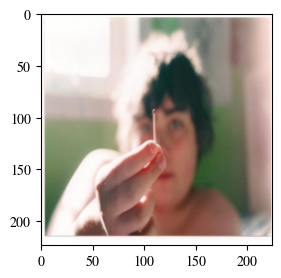

raw_pred matchstick 644
smooth_pred matchstick 644
Rank 1: Label ID = 644, Label = matchstick, Logit = 11.3701, Probability = 0.9308
Rank 2: Label ID = 626, Label = lighter, light, igniter, ignitor, Logit = 7.4342, Probability = 0.0182


  0%|          | 0/1000 [00:00<?, ?it/s]

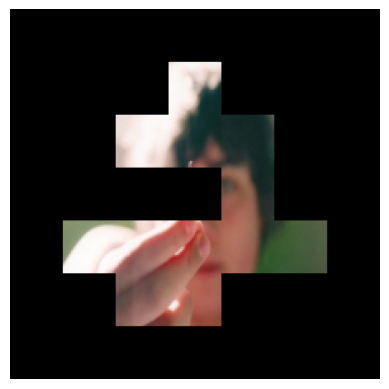

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9733333587646484, 0.8799999952316284, 0.7400000095367432, 0.6000000238418579, 0.5066666603088379]
hard stability radius tensor([0.3594], device='cuda:0')
529


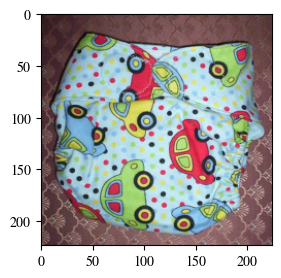

raw_pred diaper, nappy, napkin 529
smooth_pred diaper, nappy, napkin 529
Rank 1: Label ID = 529, Label = diaper, nappy, napkin, Logit = 12.7338, Probability = 0.8557
Rank 2: Label ID = 793, Label = shower cap, Logit = 10.8355, Probability = 0.1282


  0%|          | 0/1000 [00:00<?, ?it/s]

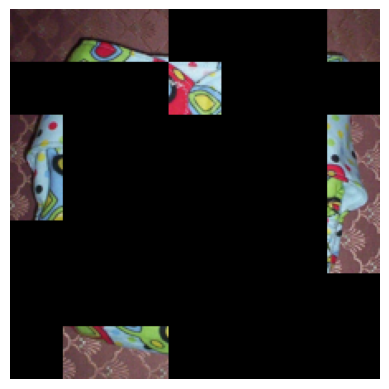

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.699999988079071, 0.7133333683013916, 0.6733333468437195, 0.7666667103767395, 0.7933333516120911]
hard stability radius tensor([0.8984], device='cuda:0')
915


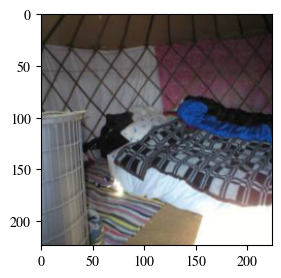

raw_pred yurt 915
smooth_pred yurt 915
Rank 1: Label ID = 915, Label = yurt, Logit = 14.1793, Probability = 0.9982
Rank 2: Label ID = 672, Label = mountain tent, Logit = 5.9238, Probability = 0.0003


  0%|          | 0/1000 [00:00<?, ?it/s]

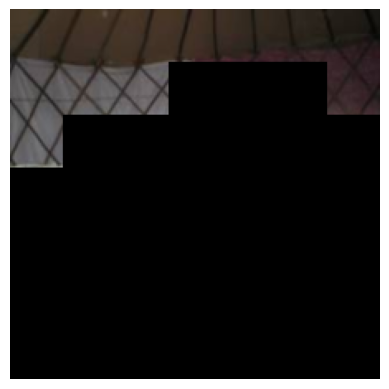

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.3750], device='cuda:0')
931


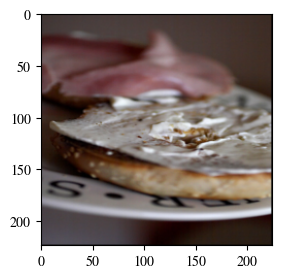

raw_pred bagel, beigel 931
smooth_pred bagel, beigel 931
Rank 1: Label ID = 931, Label = bagel, beigel, Logit = 12.0441, Probability = 0.9374
Rank 2: Label ID = 923, Label = plate, Logit = 7.3405, Probability = 0.0085


  0%|          | 0/1000 [00:00<?, ?it/s]

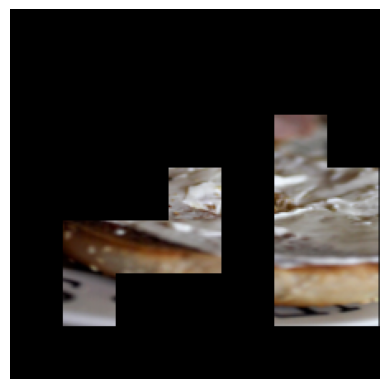

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9066666960716248, 0.8533333539962769, 0.8333333730697632, 0.846666693687439, 0.8533333539962769]
hard stability radius tensor([0.0312], device='cuda:0')
166


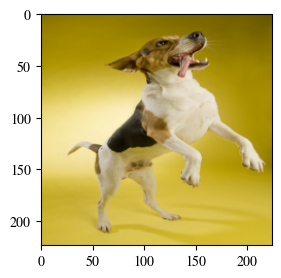

raw_pred Walker hound, Walker foxhound 166
smooth_pred Walker hound, Walker foxhound 166
Rank 1: Label ID = 166, Label = Walker hound, Walker foxhound, Logit = 14.3362, Probability = 0.8807
Rank 2: Label ID = 167, Label = English foxhound, Logit = 12.2487, Probability = 0.1092


  0%|          | 0/1000 [00:00<?, ?it/s]

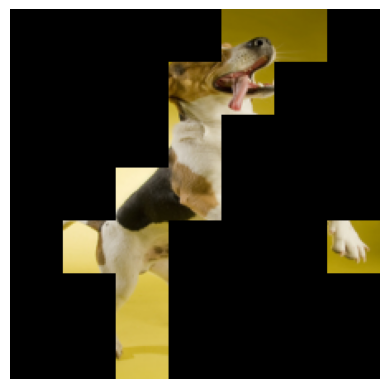

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.8533333539962769, 0.8600000143051147, 0.9466667175292969, 0.9466667175292969, 0.9600000381469727]
hard stability radius tensor([0.1094], device='cuda:0')
678


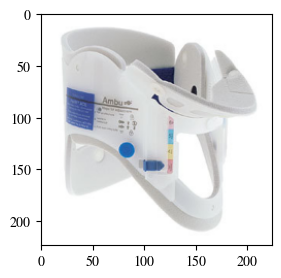

raw_pred neck brace 678
smooth_pred neck brace 678
Rank 1: Label ID = 678, Label = neck brace, Logit = 14.8777, Probability = 0.9982
Rank 2: Label ID = 861, Label = toilet seat, Logit = 7.3476, Probability = 0.0005


  0%|          | 0/1000 [00:00<?, ?it/s]

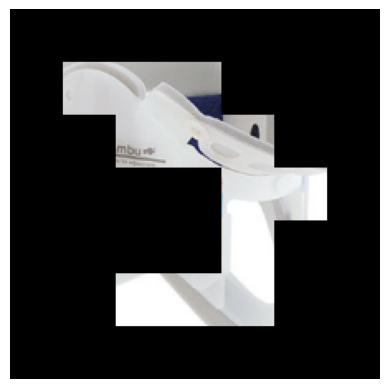

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9066666960716248, 0.8266667127609253, 0.7733333706855774, 0.7200000286102295, 0.746666669845581]
hard stability radius tensor([0.0742], device='cuda:0')
681


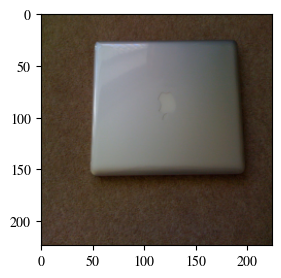

raw_pred notebook, notebook computer 681
smooth_pred notebook, notebook computer 681
Rank 1: Label ID = 681, Label = notebook, notebook computer, Logit = 12.2238, Probability = 0.6563
Rank 2: Label ID = 620, Label = laptop, laptop computer, Logit = 11.4970, Probability = 0.3173


  0%|          | 0/1000 [00:00<?, ?it/s]

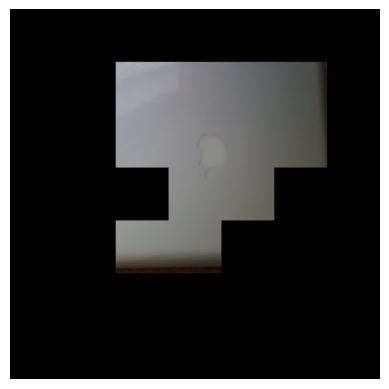

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9666666984558105, 0.8533333539962769, 0.7133333683013916, 0.5200000405311584, 0.29333335161209106]
hard stability radius tensor([0.0039], device='cuda:0')
308


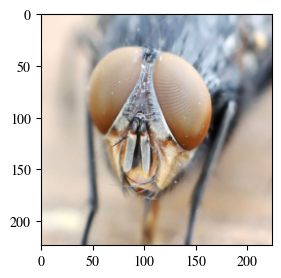

raw_pred fly 308
smooth_pred fly 308
Rank 1: Label ID = 308, Label = fly, Logit = 13.1155, Probability = 0.9952
Rank 2: Label ID = 319, Label = dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk, Logit = 5.6771, Probability = 0.0006


  0%|          | 0/1000 [00:00<?, ?it/s]

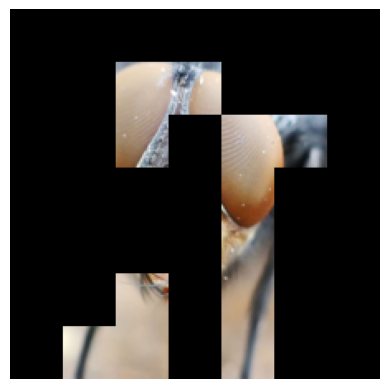

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.893333375453949, 0.699999988079071, 0.5733333230018616, 0.41333335638046265, 0.29333335161209106]
hard stability radius tensor([0.2070], device='cuda:0')
582


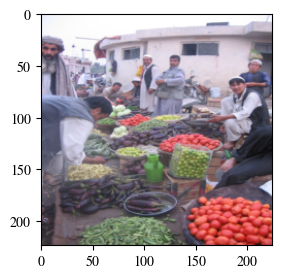

raw_pred grocery store, grocery, food market, market 582
smooth_pred grocery store, grocery, food market, market 582
Rank 1: Label ID = 582, Label = grocery store, grocery, food market, market, Logit = 8.6247, Probability = 0.5179
Rank 2: Label ID = 943, Label = cucumber, cuke, Logit = 7.7711, Probability = 0.2206


  0%|          | 0/1000 [00:00<?, ?it/s]

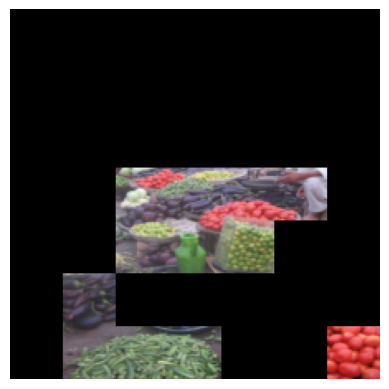

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9133333563804626, 0.9399999976158142, 0.9800000190734863, 1.0, 1.0]
hard stability radius tensor([0.3125], device='cuda:0')
459


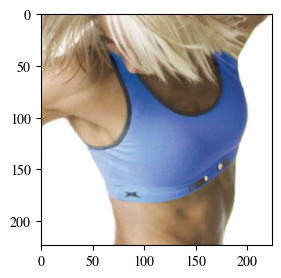

raw_pred brassiere, bra, bandeau 459
smooth_pred brassiere, bra, bandeau 459
Rank 1: Label ID = 459, Label = brassiere, bra, bandeau, Logit = 11.3690, Probability = 0.6473
Rank 2: Label ID = 638, Label = maillot, Logit = 10.3115, Probability = 0.2248


  0%|          | 0/1000 [00:00<?, ?it/s]

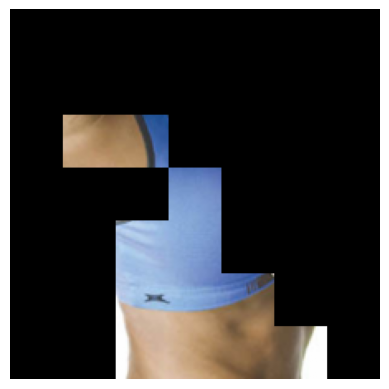

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9866666793823242, 0.9533333778381348, 0.9600000381469727, 0.9666666984558105, 0.9733333587646484]
hard stability radius tensor([0.1094], device='cuda:0')
982


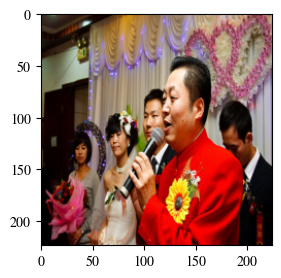

raw_pred groom, bridegroom 982
smooth_pred groom, bridegroom 982
Rank 1: Label ID = 982, Label = groom, bridegroom, Logit = 10.6712, Probability = 0.9143
Rank 2: Label ID = 578, Label = gown, Logit = 7.7302, Probability = 0.0483


  0%|          | 0/1000 [00:00<?, ?it/s]

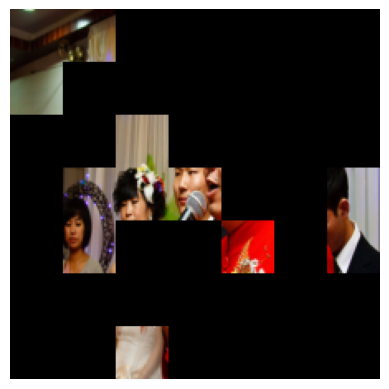

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.4933333396911621, 0.3333333432674408, 0.2199999988079071, 0.14000000059604645, 0.12000000476837158]
hard stability radius tensor([0.1719], device='cuda:0')
984


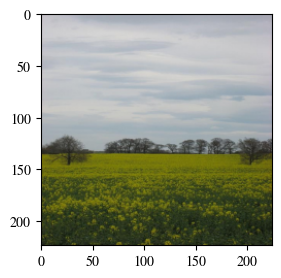

raw_pred rapeseed 984
smooth_pred rapeseed 984
Rank 1: Label ID = 984, Label = rapeseed, Logit = 14.9687, Probability = 0.9995
Rank 2: Label ID = 425, Label = barn, Logit = 3.8365, Probability = 0.0000


  0%|          | 0/1000 [00:00<?, ?it/s]

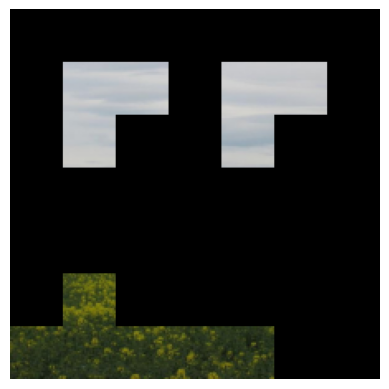

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([1.], device='cuda:0')
368


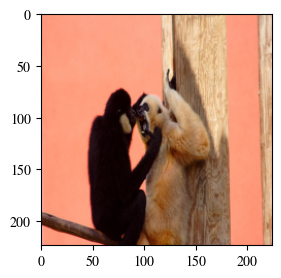

raw_pred gibbon, Hylobates lar 368
smooth_pred gibbon, Hylobates lar 368
Rank 1: Label ID = 368, Label = gibbon, Hylobates lar, Logit = 14.9564, Probability = 0.9826
Rank 2: Label ID = 374, Label = langur, Logit = 9.6195, Probability = 0.0047


  0%|          | 0/1000 [00:00<?, ?it/s]

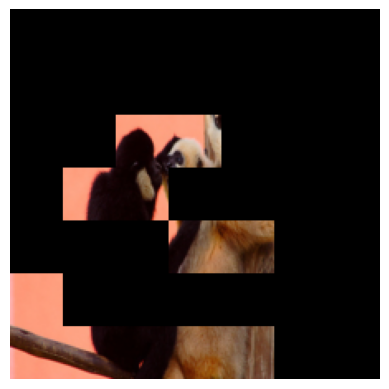

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.], device='cuda:0')


In [127]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

lime_cand_stability_pass = []
for idx in lime_cand_idxs_feas:
    print(idx)
    image = images[idx][None]
    # image = image * 2 - 1
    image_name = f'image_{idx}'
    
    # show image

    # plt.imshow(image[0].cpu().permute(1,2,0))
    plt.figure(figsize=(3,3))
    plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
    plt.show()
    raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
    set_random_seed(42)
    smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
    print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
    print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)
    
    # if raw_pred != smooth_pred:
    #     continue

    # get top_k predictions
    top_k = 2
    top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

    # Print the top k predictions
    for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
        print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")
        
    num_patches=grid_size * grid_size #49
    top_k_frac = 0.25
    
    set_random_seed(42)
    lime_expln_alpha, lime_expln, lime_expln_attrs = get_lime_for_image(wrapped_vit, 
                                                                        image[0], return_verbose=True,
                                                                       num_patches=num_patches, top_k_frac=top_k_frac)
    vis_masked_img(image=image.cpu(), alpha=lime_expln_alpha.cpu()) 
    
    exp = lime_expln_alpha
    
    ss_list = []
    for r in tqdm(range(1, 6)):
    # for r in tqdm(range(0, 196, 10)):
        set_random_seed(42)
        ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
        ss_list.append(ss)
    print('soft stability', ss_list)
    set_random_seed(42)
    hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
    print('hard stability radius', hs_radius)
    ss_radius = 0
    for r in range(len(ss_list)):
        if r >= 0.9:
            ss_radius += 1
        else:
            break
    
    if np.mean(ss_list) < 1: # and hs_radius >= 1 and ss_radius > hs_radius:
        lime_cand_stability_pass.append(idx)

In [128]:
lime_cand_stability_pass

[644, 529, 931, 166, 678, 681, 308, 582, 459, 982]

402


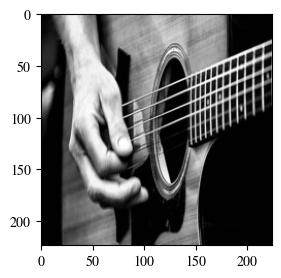

raw_pred acoustic guitar 402
smooth_pred acoustic guitar 402
Rank 1: Label ID = 402, Label = acoustic guitar, Logit = 14.1416, Probability = 0.9436
Rank 2: Label ID = 714, Label = pick, plectrum, plectron, Logit = 11.2365, Probability = 0.0517


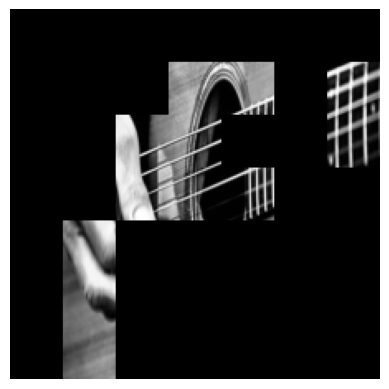

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.9609], device='cuda:0')
931


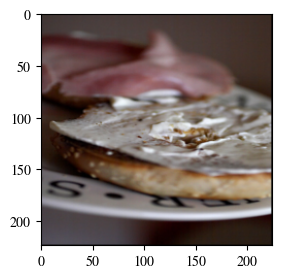

raw_pred bagel, beigel 931
smooth_pred bagel, beigel 931
Rank 1: Label ID = 931, Label = bagel, beigel, Logit = 12.0441, Probability = 0.9374
Rank 2: Label ID = 923, Label = plate, Logit = 7.3405, Probability = 0.0085


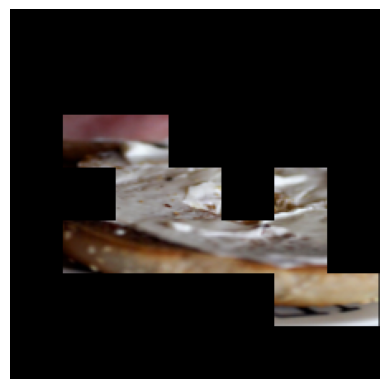

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 0.9800000190734863, 0.9466667175292969, 0.9733333587646484, 0.9866666793823242]
hard stability radius tensor([0.5469], device='cuda:0')


In [131]:
from PIL import Image
import matplotlib.pyplot as plt

shap_cand_stability_pass = []
# for idx in shap_cand_idxs_feas:
for idx in [402, 931]:
    print(idx)
    image = images[idx][None]
    # image = image * 2 - 1
    image_name = f'image_{idx}'
    
    # show image

    # plt.imshow(image[0].cpu().permute(1,2,0))
    plt.figure(figsize=(3,3))
    plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
    plt.show()
    raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
    set_random_seed(42)
    smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
    print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
    print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)

    # if raw_pred != smooth_pred:
    #     continue
    
    # get top_k predictions
    top_k = 2
    top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

    # Print the top k predictions
    for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
        print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")
        
    num_patches=grid_size * grid_size #49
    top_k_frac = 0.25
    
    set_random_seed(42)
    shap_expln_alpha, shap_expln, shap_expln_attrs = get_shap_for_image(wrapped_vit, 
                                                                        image[0], return_verbose=True,
                                                                       num_patches=num_patches, top_k_frac=top_k_frac)
    vis_masked_img(image=image.cpu(), alpha=shap_expln_alpha.cpu()) 
    
    exp = shap_expln_alpha
    
    ss_list = []
    for r in tqdm(range(1, 6)):
    # for r in tqdm(range(0, 196, 10)):
        set_random_seed(42)
        ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
        ss_list.append(ss)
    print('soft stability', ss_list)
    set_random_seed(42)
    hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
    print('hard stability radius', hs_radius)
    
    ss_radius = 0
    for r in range(len(ss_list)):
        if r >= 0.9:
            ss_radius += 1
        else:
            break
    
    if np.mean(ss_list) < 1: # and hs_radius >= 1 and ss_radius > hs_radius:
        shap_cand_stability_pass.append(idx)

384


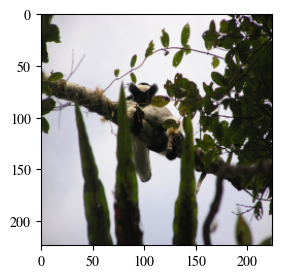

raw_pred indri, indris, Indri indri, Indri brevicaudatus 384
smooth_pred indri, indris, Indri indri, Indri brevicaudatus 384
Rank 1: Label ID = 384, Label = indri, indris, Indri indri, Indri brevicaudatus, Logit = 14.4282, Probability = 0.9856
Rank 2: Label ID = 364, Label = three-toed sloth, ai, Bradypus tridactylus, Logit = 9.6117, Probability = 0.0080


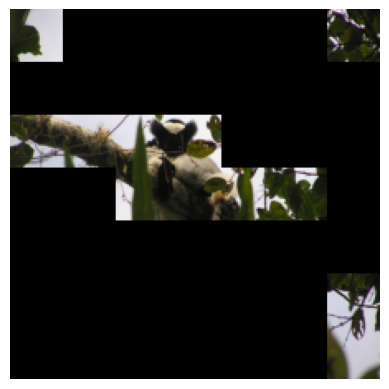

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9866666793823242, 0.9800000190734863, 0.9399999976158142, 0.9133333563804626, 0.9266666769981384]
hard stability radius tensor([0.5078], device='cuda:0')
644


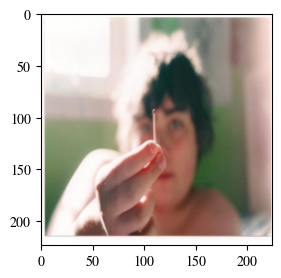

raw_pred matchstick 644
smooth_pred matchstick 644
Rank 1: Label ID = 644, Label = matchstick, Logit = 11.3701, Probability = 0.9308
Rank 2: Label ID = 626, Label = lighter, light, igniter, ignitor, Logit = 7.4342, Probability = 0.0182


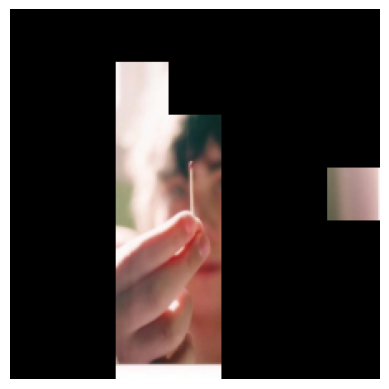

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([1.], device='cuda:0')
402


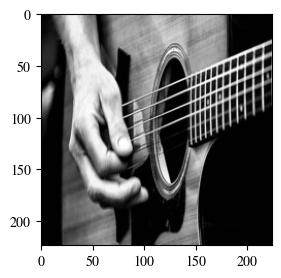

raw_pred acoustic guitar 402
smooth_pred acoustic guitar 402
Rank 1: Label ID = 402, Label = acoustic guitar, Logit = 14.1416, Probability = 0.9436
Rank 2: Label ID = 714, Label = pick, plectrum, plectron, Logit = 11.2365, Probability = 0.0517


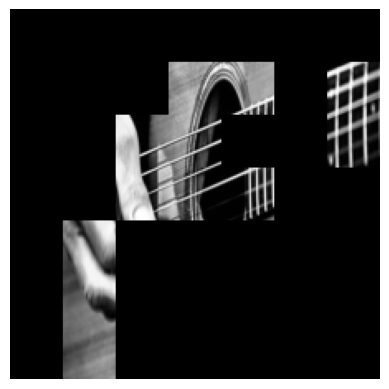

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.9609], device='cuda:0')
924


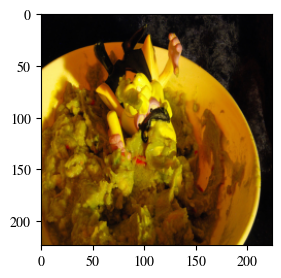

raw_pred guacamole 924
smooth_pred guacamole 924
Rank 1: Label ID = 924, Label = guacamole, Logit = 12.8669, Probability = 0.9877
Rank 2: Label ID = 659, Label = mixing bowl, Logit = 6.0754, Probability = 0.0011


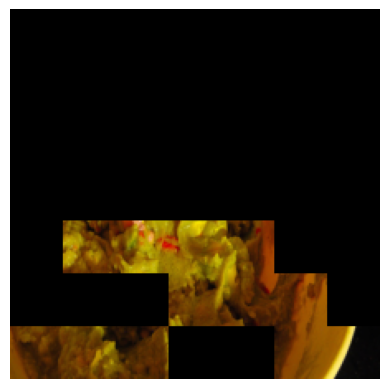

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.19333334267139435, 0.1066666692495346, 0.013333333656191826, 0.0, 0.0]
hard stability radius tensor([0.2930], device='cuda:0')
931


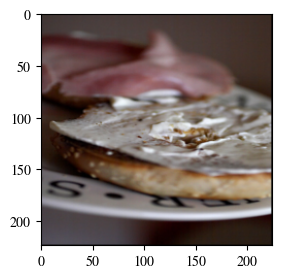

raw_pred bagel, beigel 931
smooth_pred bagel, beigel 931
Rank 1: Label ID = 931, Label = bagel, beigel, Logit = 12.0441, Probability = 0.9374
Rank 2: Label ID = 923, Label = plate, Logit = 7.3405, Probability = 0.0085


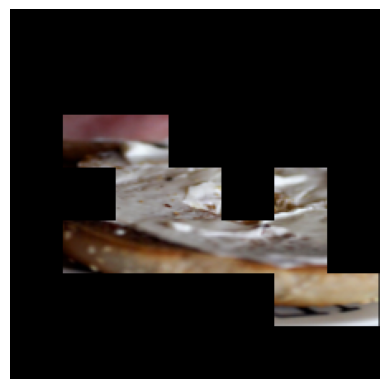

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 0.9800000190734863, 0.9866666793823242, 0.9399999976158142, 0.9600000381469727]
hard stability radius tensor([0.5469], device='cuda:0')
681


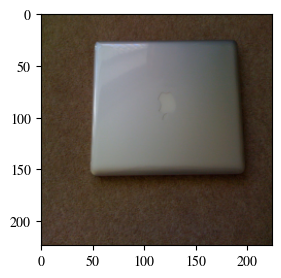

raw_pred notebook, notebook computer 681
smooth_pred notebook, notebook computer 681
Rank 1: Label ID = 681, Label = notebook, notebook computer, Logit = 12.2238, Probability = 0.6563
Rank 2: Label ID = 620, Label = laptop, laptop computer, Logit = 11.4970, Probability = 0.3173


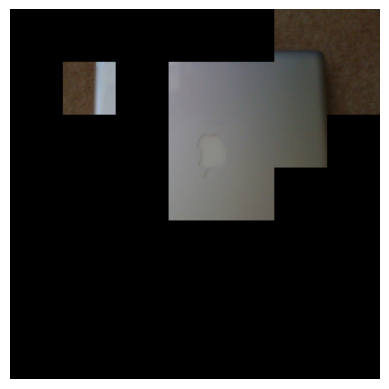

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 0.9933333396911621, 1.0]
hard stability radius tensor([0.3438], device='cuda:0')
691


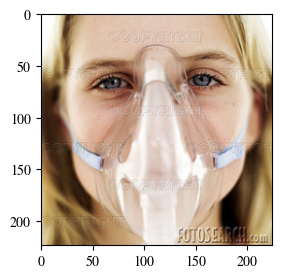

raw_pred oxygen mask 691
smooth_pred oxygen mask 691
Rank 1: Label ID = 691, Label = oxygen mask, Logit = 15.2636, Probability = 0.9783
Rank 2: Label ID = 570, Label = gasmask, respirator, gas helmet, Logit = 11.4206, Probability = 0.0210


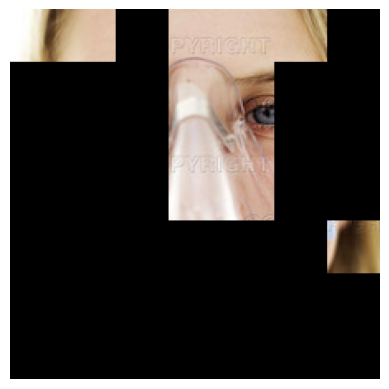

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 0.9866666793823242, 1.0, 0.9933333396911621]
hard stability radius tensor([0.1328], device='cuda:0')
308


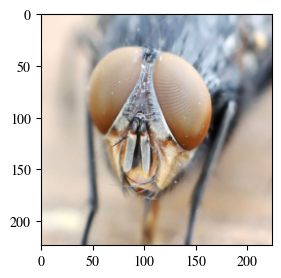

raw_pred fly 308
smooth_pred fly 308
Rank 1: Label ID = 308, Label = fly, Logit = 13.1155, Probability = 0.9952
Rank 2: Label ID = 319, Label = dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk, Logit = 5.6771, Probability = 0.0006


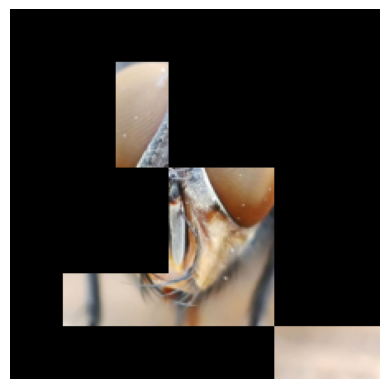

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.0430], device='cuda:0')
449


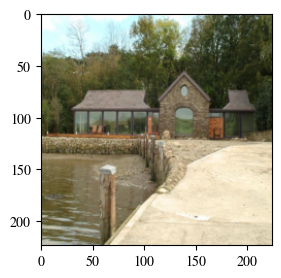

raw_pred boathouse 449
smooth_pred lakeside, lakeshore 975
Rank 1: Label ID = 449, Label = boathouse, Logit = 12.5485, Probability = 0.6085
Rank 2: Label ID = 975, Label = lakeside, lakeshore, Logit = 12.0686, Probability = 0.3766


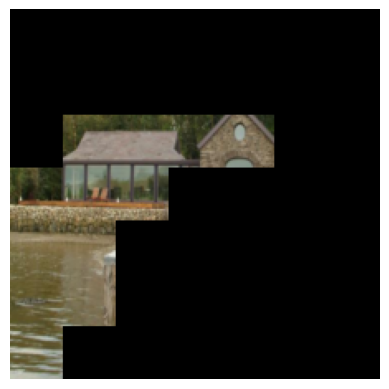

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 0.9866666793823242, 0.9333333373069763, 0.9133333563804626, 0.8533333539962769]
hard stability radius tensor([0.7500], device='cuda:0')
459


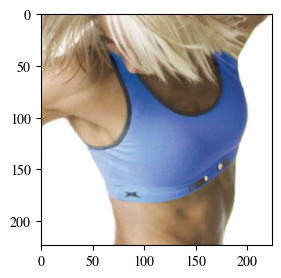

raw_pred brassiere, bra, bandeau 459
smooth_pred brassiere, bra, bandeau 459
Rank 1: Label ID = 459, Label = brassiere, bra, bandeau, Logit = 11.3690, Probability = 0.6473
Rank 2: Label ID = 638, Label = maillot, Logit = 10.3115, Probability = 0.2248


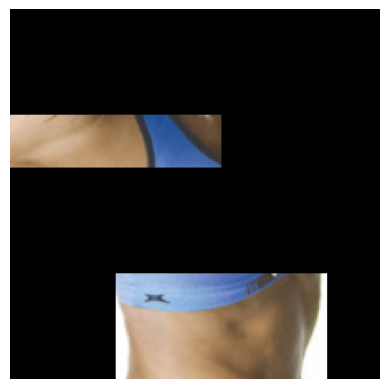

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.7933333516120911, 0.7666667103767395, 0.8799999952316284, 0.9133333563804626, 0.9000000357627869]
hard stability radius tensor([0.0039], device='cuda:0')
368


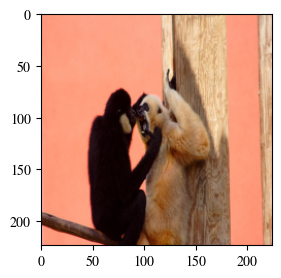

raw_pred gibbon, Hylobates lar 368
smooth_pred gibbon, Hylobates lar 368
Rank 1: Label ID = 368, Label = gibbon, Hylobates lar, Logit = 14.9564, Probability = 0.9826
Rank 2: Label ID = 374, Label = langur, Logit = 9.6195, Probability = 0.0047


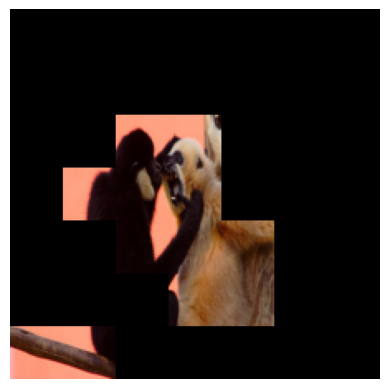

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.7599999904632568, 0.46666666865348816, 0.2800000011920929, 0.20666667819023132, 0.15333333611488342]
hard stability radius tensor([0.0312], device='cuda:0')
891


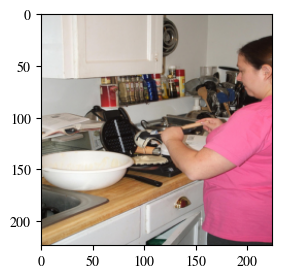

raw_pred waffle iron 891
smooth_pred waffle iron 891
Rank 1: Label ID = 891, Label = waffle iron, Logit = 15.0154, Probability = 0.9956
Rank 2: Label ID = 659, Label = mixing bowl, Logit = 8.2474, Probability = 0.0011


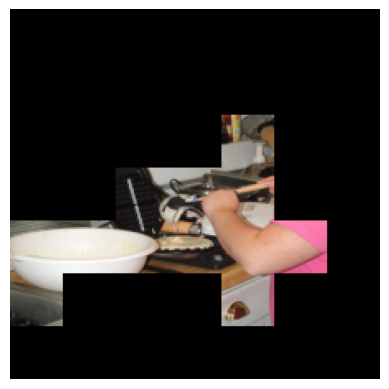

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.4333333373069763, 0.3199999928474426, 0.1733333319425583, 0.1066666692495346, 0.046666666865348816]
hard stability radius tensor([0.0156], device='cuda:0')
892


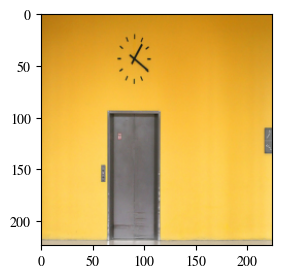

raw_pred wall clock 892
smooth_pred analog clock 409
Rank 1: Label ID = 892, Label = wall clock, Logit = 11.4065, Probability = 0.9301
Rank 2: Label ID = 409, Label = analog clock, Logit = 7.7324, Probability = 0.0236


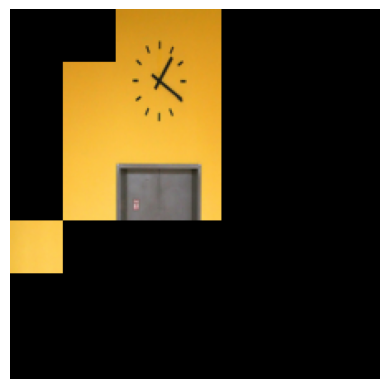

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.6666666865348816, 0.6066666841506958, 0.3933333456516266, 0.4266666769981384, 0.3733333349227905]
hard stability radius tensor([0.1797], device='cuda:0')
639


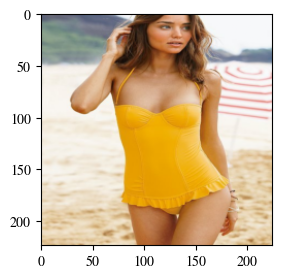

raw_pred maillot, tank suit 639
smooth_pred maillot, tank suit 639
Rank 1: Label ID = 639, Label = maillot, tank suit, Logit = 15.4223, Probability = 0.6559
Rank 2: Label ID = 638, Label = maillot, Logit = 14.7699, Probability = 0.3416


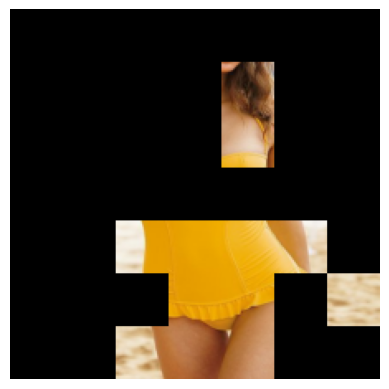

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [0.9600000381469727, 0.7599999904632568, 0.5800000429153442, 0.6133333444595337, 0.5133333206176758]
hard stability radius tensor([0.0391], device='cuda:0')


In [132]:
from PIL import Image
import matplotlib.pyplot as plt

shap_cand_stability_pass = []
for idx in shap_cand_idxs_feas:
    print(idx)
    image = images[idx][None]
    # image = image * 2 - 1
    image_name = f'image_{idx}'
    
    # show image

    # plt.imshow(image[0].cpu().permute(1,2,0))
    plt.figure(figsize=(3,3))
    plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
    plt.show()
    raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
    set_random_seed(42)
    smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
    print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
    print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)

    # if raw_pred != smooth_pred:
    #     continue
    
    # get top_k predictions
    top_k = 2
    top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

    # Print the top k predictions
    for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
        print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")
        
    num_patches=grid_size * grid_size #49
    top_k_frac = 0.25
    
    set_random_seed(42)
    shap_expln_alpha, shap_expln, shap_expln_attrs = get_shap_for_image(wrapped_vit, 
                                                                        image[0], return_verbose=True,
                                                                       num_patches=num_patches, top_k_frac=top_k_frac)
    vis_masked_img(image=image.cpu(), alpha=shap_expln_alpha.cpu()) 
    
    exp = shap_expln_alpha
    set_random_seed(42)
    ss_list = []
    for r in tqdm(range(1, 6)):
    # for r in tqdm(range(0, 196, 10)):
        ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
        ss_list.append(ss)
    print('soft stability', ss_list)
    set_random_seed(42)
    hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
    print('hard stability radius', hs_radius)
    
    ss_radius = 0
    for r in range(len(ss_list)):
        if r >= 0.9:
            ss_radius += 1
        else:
            break
    
    if np.mean(ss_list) < 1: # and hs_radius >= 1 and ss_radius > hs_radius:
        shap_cand_stability_pass.append(idx)

In [133]:
shap_cand_stability_pass

[384, 924, 931, 681, 691, 449, 459, 368, 891, 892, 639]

768


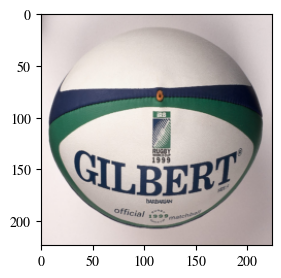

Rank 1: Label ID = 768, Label = rugby ball, Logit = 13.6252, Probability = 0.9964
Rank 2: Label ID = 890, Label = volleyball, Logit = 6.4496, Probability = 0.0008


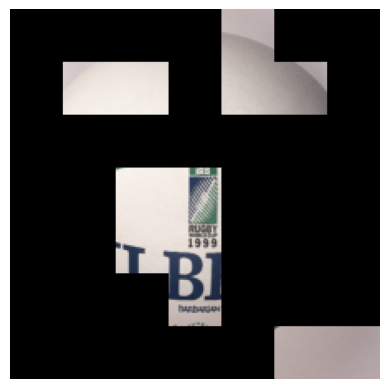

  0%|          | 0/5 [00:00<?, ?it/s]

644


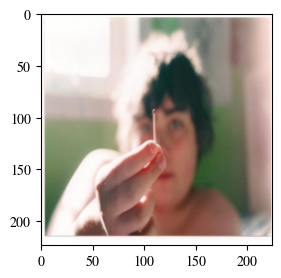

Rank 1: Label ID = 644, Label = matchstick, Logit = 11.3701, Probability = 0.9308
Rank 2: Label ID = 626, Label = lighter, light, igniter, ignitor, Logit = 7.4342, Probability = 0.0182


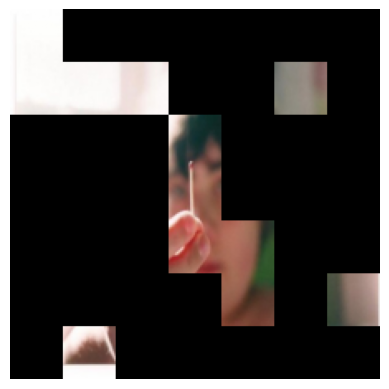

  0%|          | 0/5 [00:00<?, ?it/s]

774


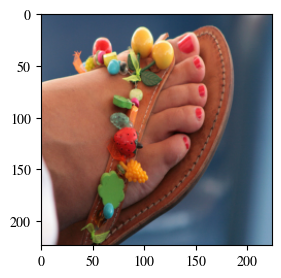

Rank 1: Label ID = 774, Label = sandal, Logit = 13.4704, Probability = 0.9869
Rank 2: Label ID = 502, Label = clog, geta, patten, sabot, Logit = 8.6220, Probability = 0.0077


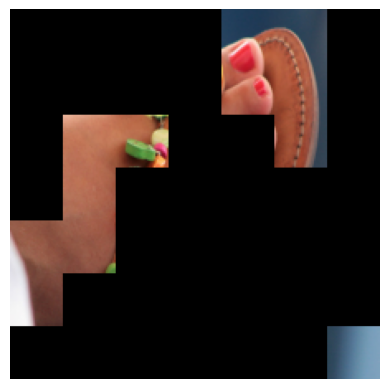

  0%|          | 0/5 [00:00<?, ?it/s]

12


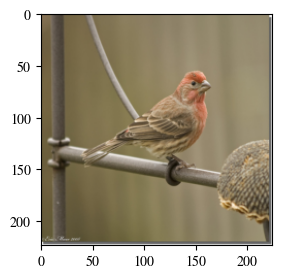

Rank 1: Label ID = 12, Label = house finch, linnet, Carpodacus mexicanus, Logit = 12.6789, Probability = 0.9375
Rank 2: Label ID = 10, Label = brambling, Fringilla montifringilla, Logit = 9.8839, Probability = 0.0573


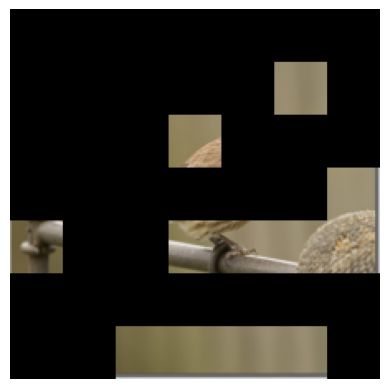

  0%|          | 0/5 [00:00<?, ?it/s]

399


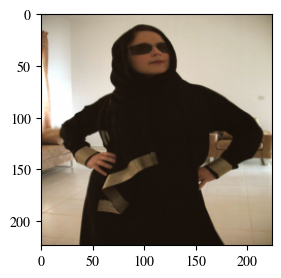

Rank 1: Label ID = 399, Label = abaya, Logit = 15.8202, Probability = 0.9998
Rank 2: Label ID = 501, Label = cloak, Logit = 5.6605, Probability = 0.0000


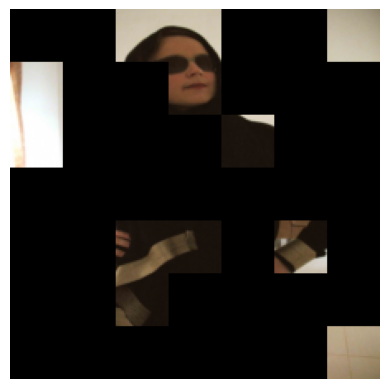

  0%|          | 0/5 [00:00<?, ?it/s]

912


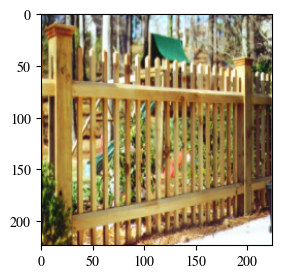

Rank 1: Label ID = 912, Label = worm fence, snake fence, snake-rail fence, Virginia fence, Logit = 11.9352, Probability = 0.9520
Rank 2: Label ID = 716, Label = picket fence, paling, Logit = 8.3935, Probability = 0.0276


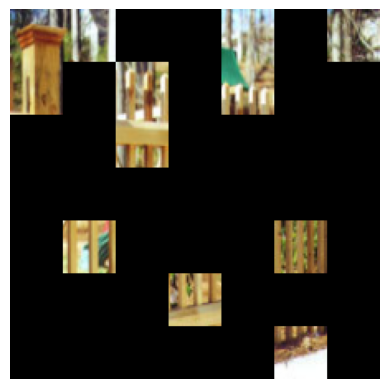

  0%|          | 0/5 [00:00<?, ?it/s]

538


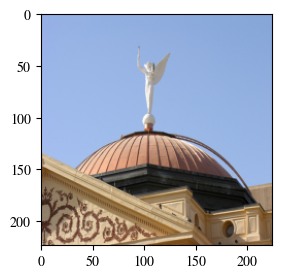

Rank 1: Label ID = 538, Label = dome, Logit = 12.5403, Probability = 0.9706
Rank 2: Label ID = 668, Label = mosque, Logit = 7.2243, Probability = 0.0048


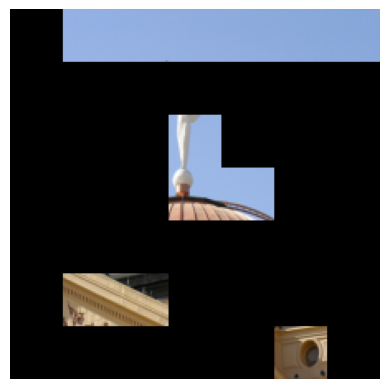

  0%|          | 0/5 [00:00<?, ?it/s]

413


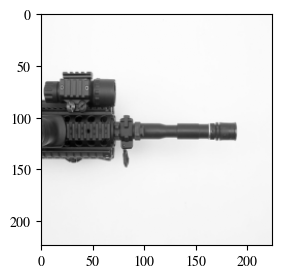

Rank 1: Label ID = 413, Label = assault rifle, assault gun, Logit = 11.9245, Probability = 0.6047
Rank 2: Label ID = 764, Label = rifle, Logit = 11.4321, Probability = 0.3696


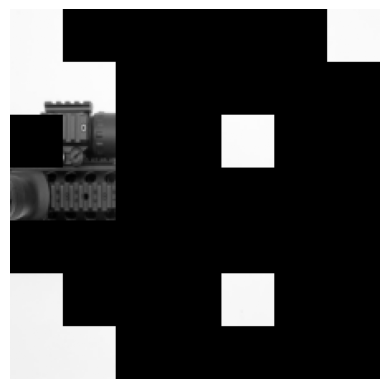

  0%|          | 0/5 [00:00<?, ?it/s]

543


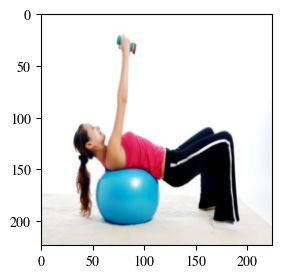

Rank 1: Label ID = 543, Label = dumbbell, Logit = 11.6250, Probability = 0.9465
Rank 2: Label ID = 422, Label = barbell, Logit = 8.3456, Probability = 0.0356


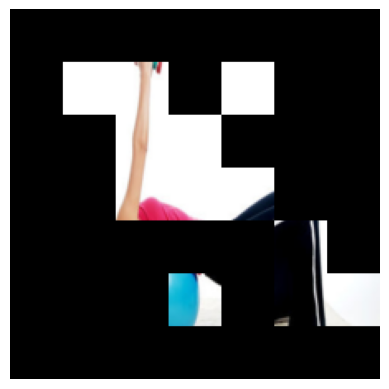

  0%|          | 0/5 [00:00<?, ?it/s]

674


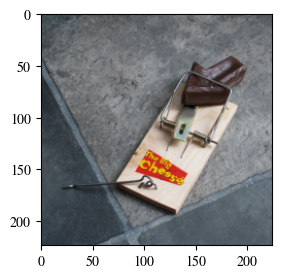

Rank 1: Label ID = 674, Label = mousetrap, Logit = 16.5742, Probability = 0.9999
Rank 2: Label ID = 673, Label = mouse, computer mouse, Logit = 4.2017, Probability = 0.0000


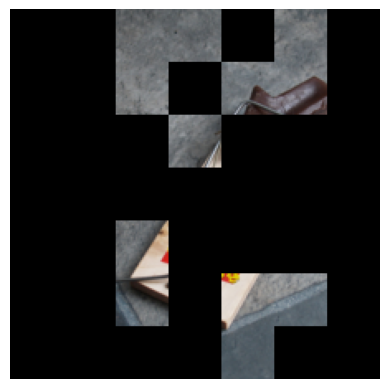

  0%|          | 0/5 [00:00<?, ?it/s]

419


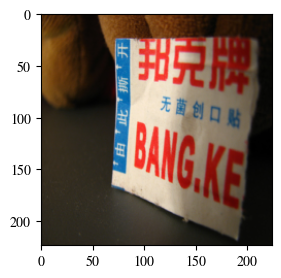

Rank 1: Label ID = 419, Label = Band Aid, Logit = 10.6969, Probability = 0.7515
Rank 2: Label ID = 692, Label = packet, Logit = 9.1059, Probability = 0.1531


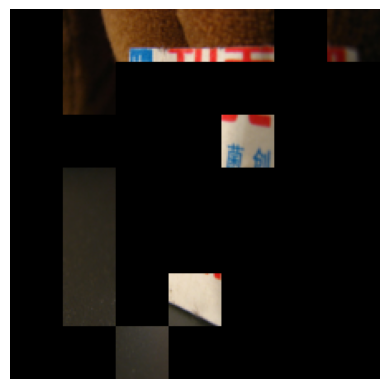

  0%|          | 0/5 [00:00<?, ?it/s]

548


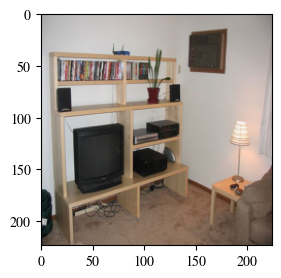

Rank 1: Label ID = 548, Label = entertainment center, Logit = 12.4490, Probability = 0.7441
Rank 2: Label ID = 453, Label = bookcase, Logit = 10.9865, Probability = 0.1724


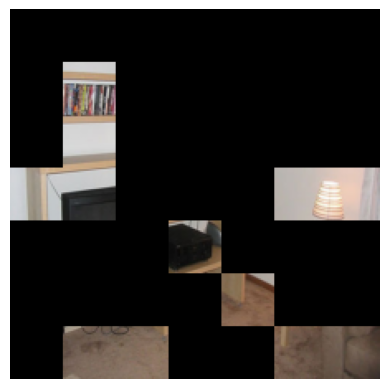

  0%|          | 0/5 [00:00<?, ?it/s]

931


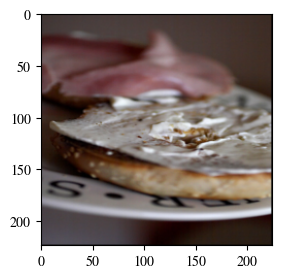

Rank 1: Label ID = 931, Label = bagel, beigel, Logit = 12.0441, Probability = 0.9374
Rank 2: Label ID = 923, Label = plate, Logit = 7.3405, Probability = 0.0085


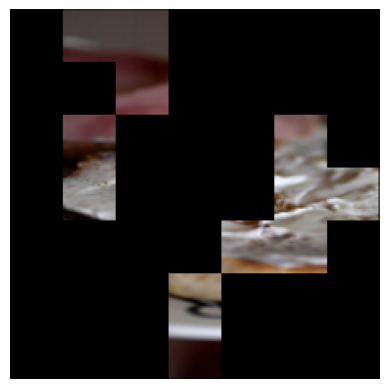

  0%|          | 0/5 [00:00<?, ?it/s]

681


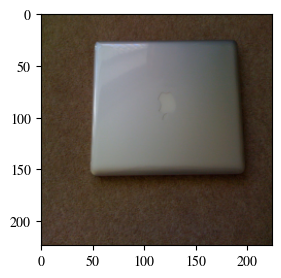

Rank 1: Label ID = 681, Label = notebook, notebook computer, Logit = 12.2238, Probability = 0.6563
Rank 2: Label ID = 620, Label = laptop, laptop computer, Logit = 11.4970, Probability = 0.3173


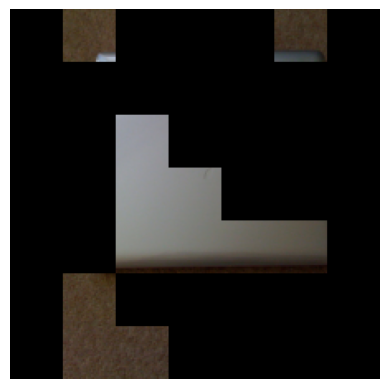

  0%|          | 0/5 [00:00<?, ?it/s]

809


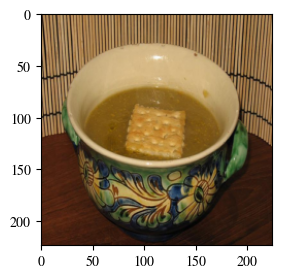

Rank 1: Label ID = 809, Label = soup bowl, Logit = 12.4594, Probability = 0.9710
Rank 2: Label ID = 925, Label = consomme, Logit = 8.5151, Probability = 0.0188


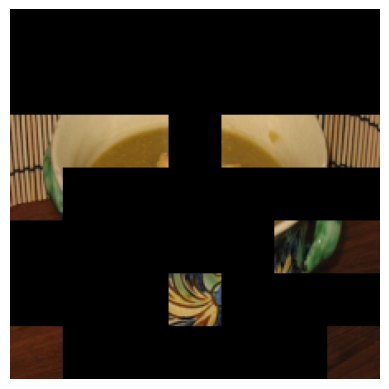

  0%|          | 0/5 [00:00<?, ?it/s]

556


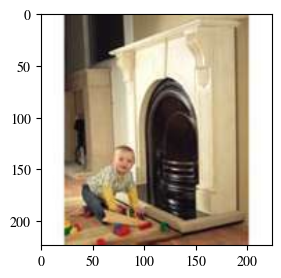

Rank 1: Label ID = 556, Label = fire screen, fireguard, Logit = 10.4503, Probability = 0.8470
Rank 2: Label ID = 827, Label = stove, Logit = 8.1258, Probability = 0.0829


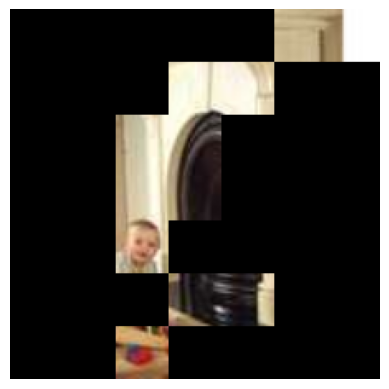

  0%|          | 0/5 [00:00<?, ?it/s]

176


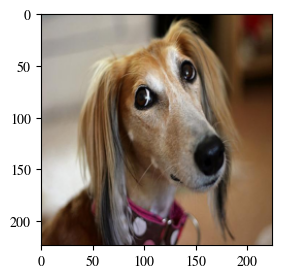

Rank 1: Label ID = 176, Label = Saluki, gazelle hound, Logit = 15.0058, Probability = 0.9956
Rank 2: Label ID = 160, Label = Afghan hound, Afghan, Logit = 9.2731, Probability = 0.0032


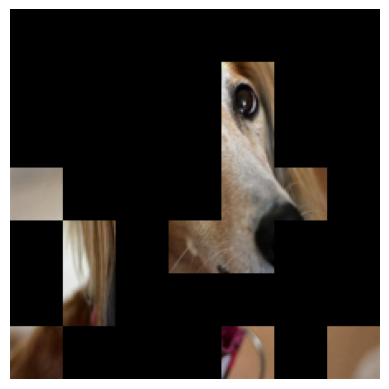

  0%|          | 0/5 [00:00<?, ?it/s]

950


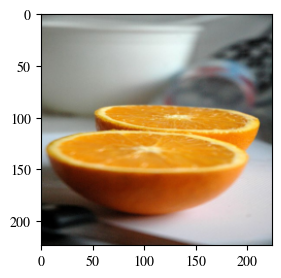

Rank 1: Label ID = 950, Label = orange, Logit = 12.4539, Probability = 0.9801
Rank 2: Label ID = 951, Label = lemon, Logit = 7.3139, Probability = 0.0057


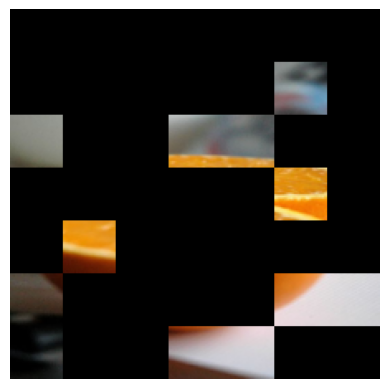

  0%|          | 0/5 [00:00<?, ?it/s]

312


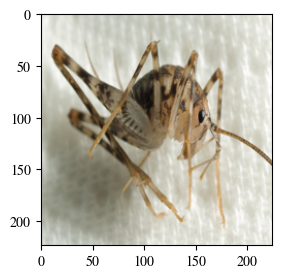

Rank 1: Label ID = 312, Label = cricket, Logit = 12.2240, Probability = 0.9041
Rank 2: Label ID = 311, Label = grasshopper, hopper, Logit = 9.4146, Probability = 0.0545


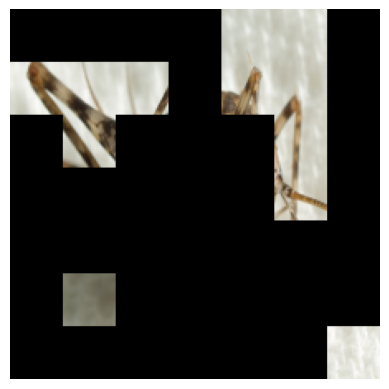

  0%|          | 0/5 [00:00<?, ?it/s]

952


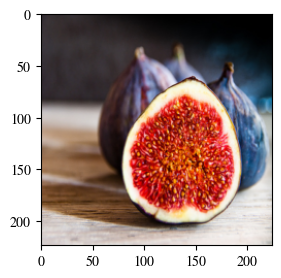

Rank 1: Label ID = 952, Label = fig, Logit = 15.2786, Probability = 0.9995
Rank 2: Label ID = 950, Label = orange, Logit = 5.2304, Probability = 0.0000


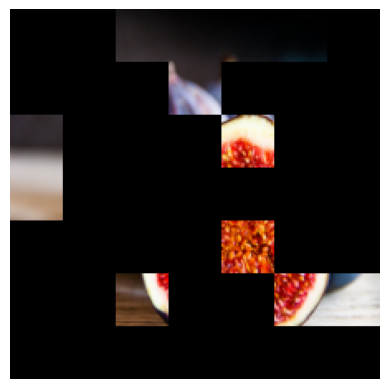

  0%|          | 0/5 [00:00<?, ?it/s]

188


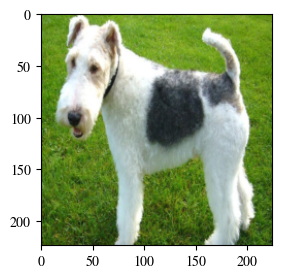

Rank 1: Label ID = 188, Label = wire-haired fox terrier, Logit = 14.9616, Probability = 0.9828
Rank 2: Label ID = 189, Label = Lakeland terrier, Logit = 10.7050, Probability = 0.0139


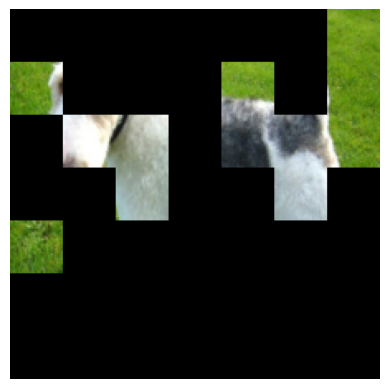

  0%|          | 0/5 [00:00<?, ?it/s]

957


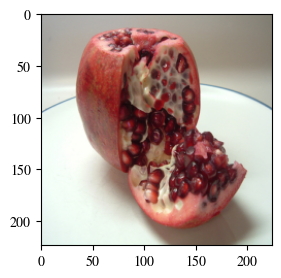

Rank 1: Label ID = 957, Label = pomegranate, Logit = 13.9500, Probability = 0.9984
Rank 2: Label ID = 950, Label = orange, Logit = 5.7930, Probability = 0.0003


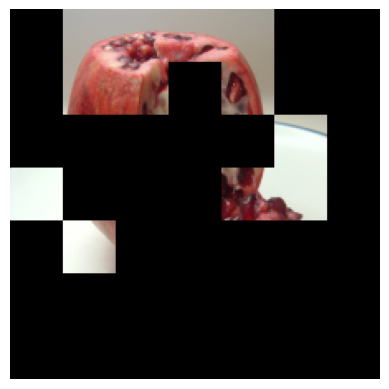

  0%|          | 0/5 [00:00<?, ?it/s]

319


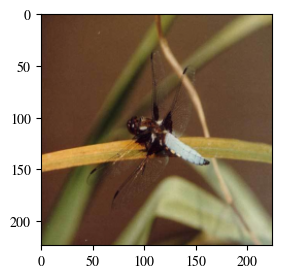

836


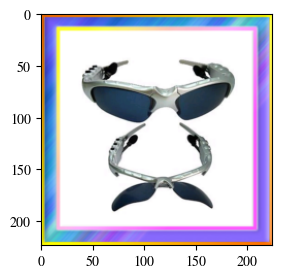

Rank 1: Label ID = 836, Label = sunglass, Logit = 14.2735, Probability = 0.9605
Rank 2: Label ID = 837, Label = sunglasses, dark glasses, shades, Logit = 11.0424, Probability = 0.0380


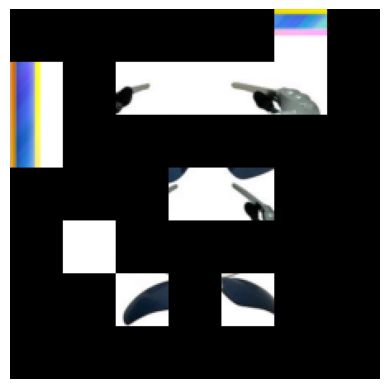

  0%|          | 0/5 [00:00<?, ?it/s]

709


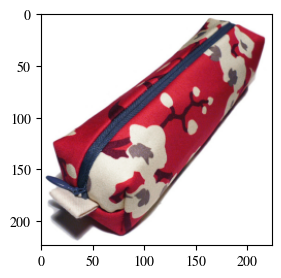

Rank 1: Label ID = 709, Label = pencil box, pencil case, Logit = 14.7529, Probability = 0.9991
Rank 2: Label ID = 797, Label = sleeping bag, Logit = 6.1657, Probability = 0.0002


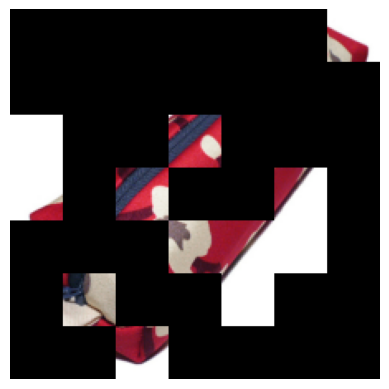

  0%|          | 0/5 [00:00<?, ?it/s]

452


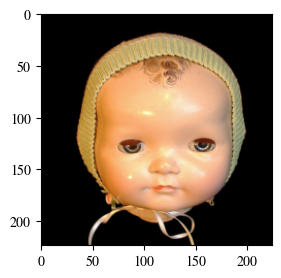

Rank 1: Label ID = 452, Label = bonnet, poke bonnet, Logit = 14.4437, Probability = 0.9976
Rank 2: Label ID = 796, Label = ski mask, Logit = 6.4893, Probability = 0.0004


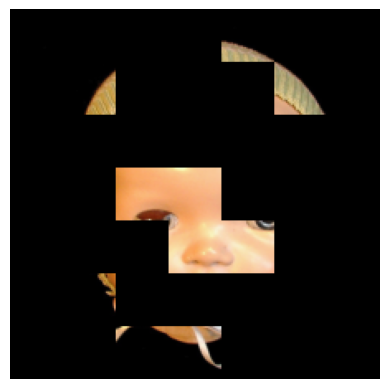

  0%|          | 0/5 [00:00<?, ?it/s]

967


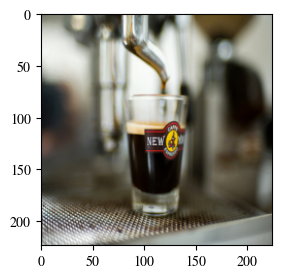

Rank 1: Label ID = 967, Label = espresso, Logit = 14.0723, Probability = 0.9260
Rank 2: Label ID = 550, Label = espresso maker, Logit = 11.4820, Probability = 0.0694


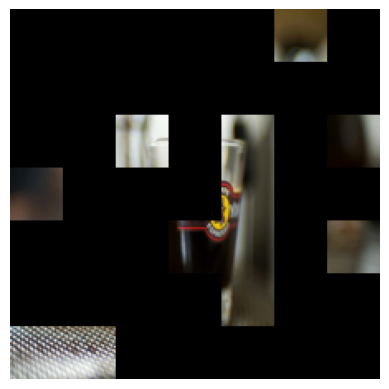

  0%|          | 0/5 [00:00<?, ?it/s]

841


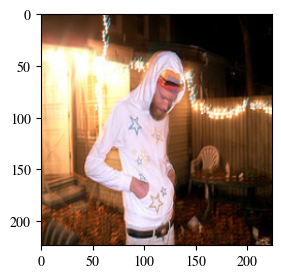

Rank 1: Label ID = 841, Label = sweatshirt, Logit = 9.4946, Probability = 0.7585
Rank 2: Label ID = 731, Label = plunger, plumber's helper, Logit = 6.0339, Probability = 0.0238


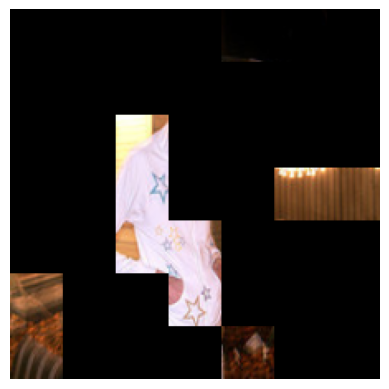

  0%|          | 0/5 [00:00<?, ?it/s]

203


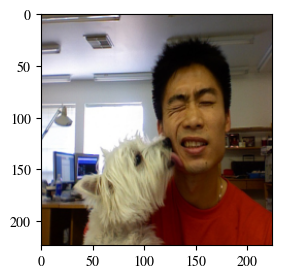

Rank 1: Label ID = 203, Label = West Highland white terrier, Logit = 12.6959, Probability = 0.9049
Rank 2: Label ID = 153, Label = Maltese dog, Maltese terrier, Maltese, Logit = 10.3040, Probability = 0.0828


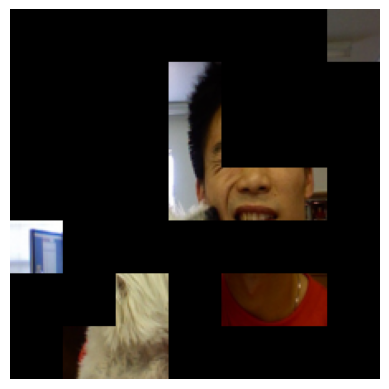

  0%|          | 0/5 [00:00<?, ?it/s]

845


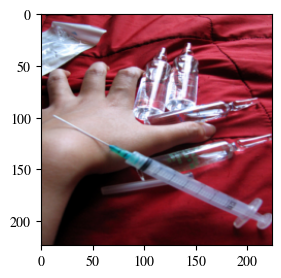

Rank 1: Label ID = 845, Label = syringe, Logit = 15.1844, Probability = 0.9991
Rank 2: Label ID = 691, Label = oxygen mask, Logit = 6.6456, Probability = 0.0002


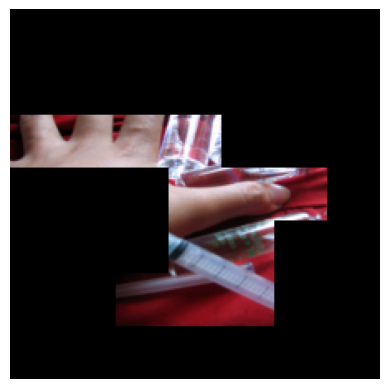

  0%|          | 0/5 [00:00<?, ?it/s]

459


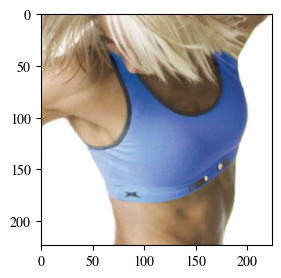

Rank 1: Label ID = 459, Label = brassiere, bra, bandeau, Logit = 11.3690, Probability = 0.6473
Rank 2: Label ID = 638, Label = maillot, Logit = 10.3115, Probability = 0.2248


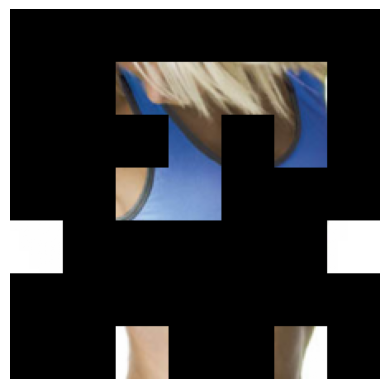

  0%|          | 0/5 [00:00<?, ?it/s]

79


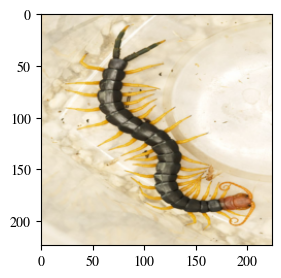

Rank 1: Label ID = 79, Label = centipede, Logit = 15.4737, Probability = 0.9995
Rank 2: Label ID = 69, Label = trilobite, Logit = 5.7593, Probability = 0.0001


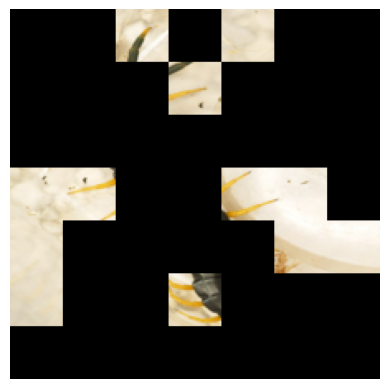

  0%|          | 0/5 [00:00<?, ?it/s]

972


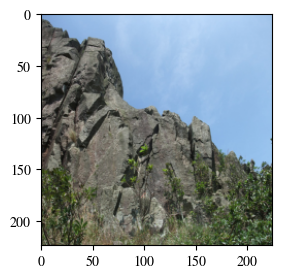

Rank 1: Label ID = 972, Label = cliff, drop, drop-off, Logit = 12.5138, Probability = 0.9885
Rank 2: Label ID = 976, Label = promontory, headland, head, foreland, Logit = 6.2132, Probability = 0.0018


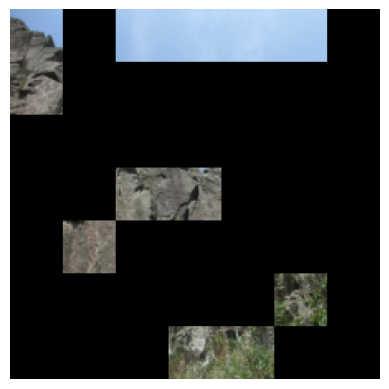

  0%|          | 0/5 [00:00<?, ?it/s]

721


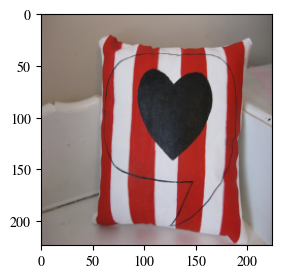

Rank 1: Label ID = 721, Label = pillow, Logit = 13.4798, Probability = 0.9928
Rank 2: Label ID = 748, Label = purse, Logit = 6.6647, Probability = 0.0011


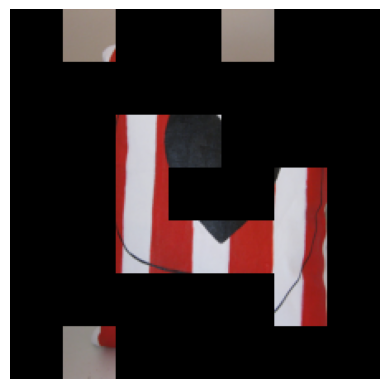

  0%|          | 0/5 [00:00<?, ?it/s]

463


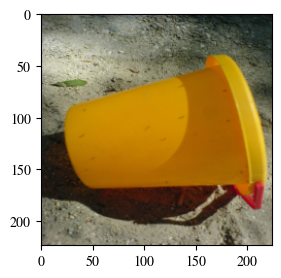

Rank 1: Label ID = 463, Label = bucket, pail, Logit = 15.8933, Probability = 0.9994
Rank 2: Label ID = 412, Label = ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin, Logit = 7.6993, Probability = 0.0003


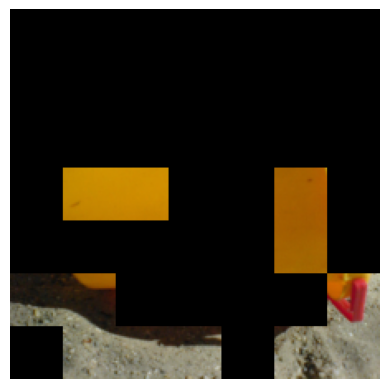

  0%|          | 0/5 [00:00<?, ?it/s]

726


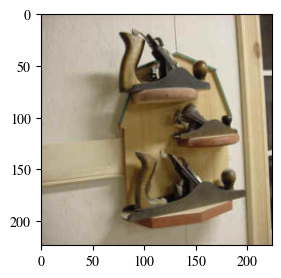

Rank 1: Label ID = 726, Label = plane, carpenter's plane, woodworking plane, Logit = 15.1403, Probability = 0.9991
Rank 2: Label ID = 502, Label = clog, geta, patten, sabot, Logit = 5.9880, Probability = 0.0001


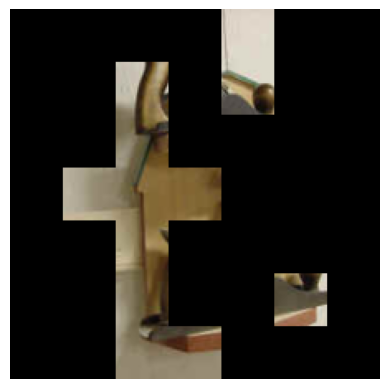

  0%|          | 0/5 [00:00<?, ?it/s]

855


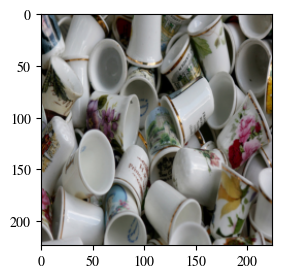

Rank 1: Label ID = 855, Label = thimble, Logit = 16.1907, Probability = 0.9997
Rank 2: Label ID = 968, Label = cup, Logit = 6.3523, Probability = 0.0001


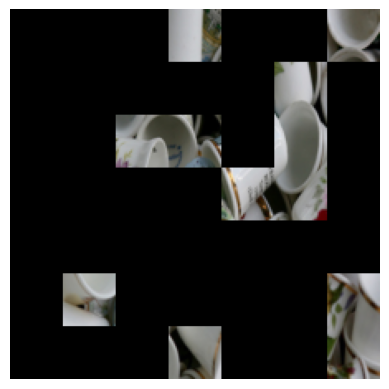

  0%|          | 0/5 [00:00<?, ?it/s]

984


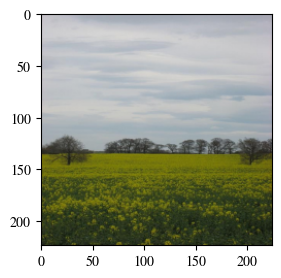

Rank 1: Label ID = 984, Label = rapeseed, Logit = 14.9687, Probability = 0.9995
Rank 2: Label ID = 425, Label = barn, Logit = 3.8365, Probability = 0.0000


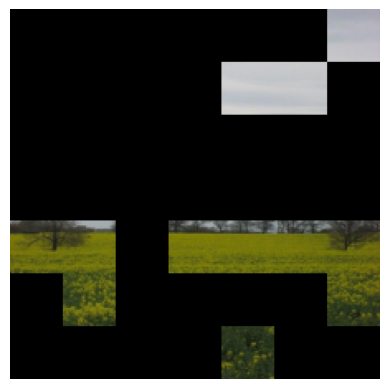

  0%|          | 0/5 [00:00<?, ?it/s]

217


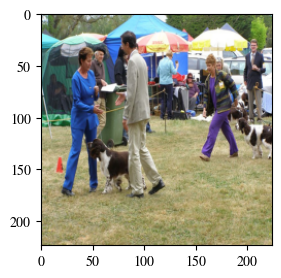

Rank 1: Label ID = 217, Label = English springer, English springer spaniel, Logit = 13.0034, Probability = 0.9681
Rank 2: Label ID = 220, Label = Sussex spaniel, Logit = 8.6971, Probability = 0.0131


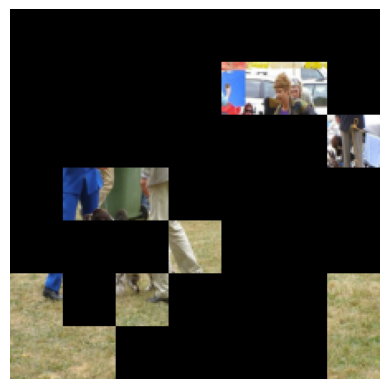

  0%|          | 0/5 [00:00<?, ?it/s]

604


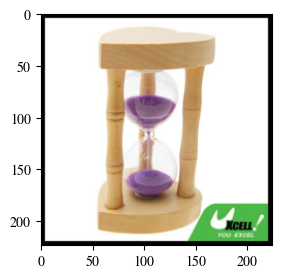

Rank 1: Label ID = 604, Label = hourglass, Logit = 15.5072, Probability = 0.9996
Rank 2: Label ID = 826, Label = stopwatch, stop watch, Logit = 4.5949, Probability = 0.0000


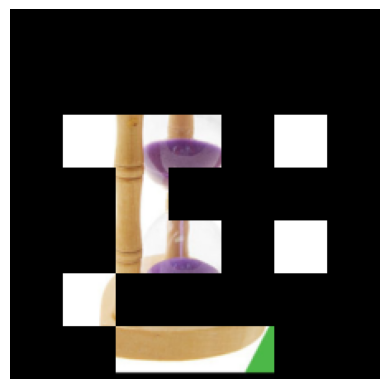

  0%|          | 0/5 [00:00<?, ?it/s]

861


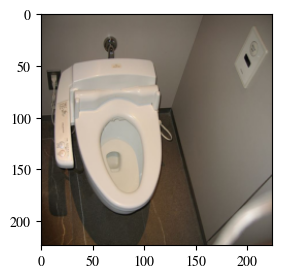

Rank 1: Label ID = 861, Label = toilet seat, Logit = 12.7490, Probability = 0.9813
Rank 2: Label ID = 731, Label = plunger, plumber's helper, Logit = 7.9300, Probability = 0.0079


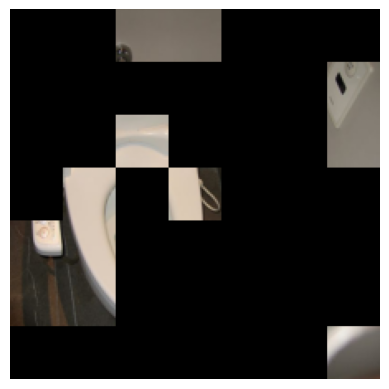

  0%|          | 0/5 [00:00<?, ?it/s]

737


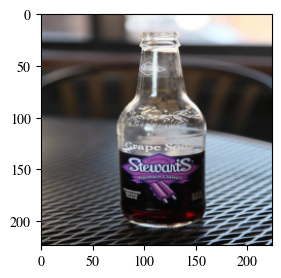

Rank 1: Label ID = 737, Label = pop bottle, soda bottle, Logit = 12.4492, Probability = 0.9741
Rank 2: Label ID = 440, Label = beer bottle, Logit = 8.0803, Probability = 0.0123


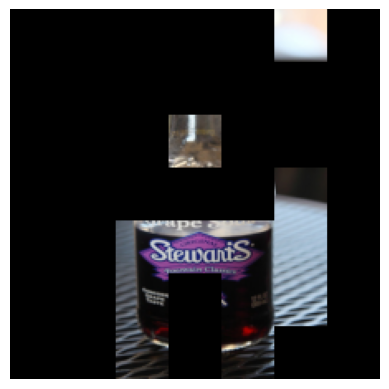

  0%|          | 0/5 [00:00<?, ?it/s]

610


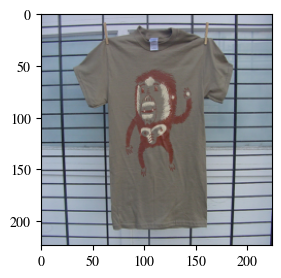

Rank 1: Label ID = 610, Label = jersey, T-shirt, tee shirt, Logit = 12.9767, Probability = 0.9939
Rank 2: Label ID = 841, Label = sweatshirt, Logit = 6.7409, Probability = 0.0019


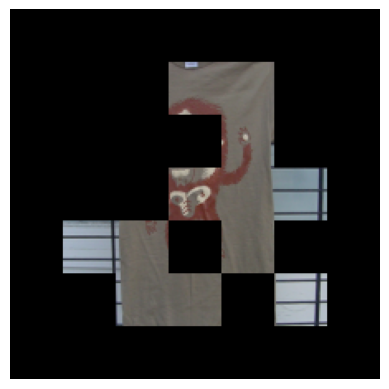

  0%|          | 0/5 [00:00<?, ?it/s]

869


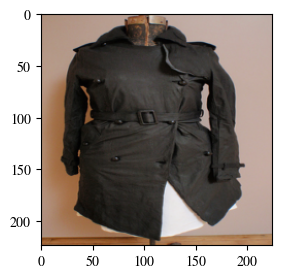

Rank 1: Label ID = 869, Label = trench coat, Logit = 14.6108, Probability = 0.9982
Rank 2: Label ID = 834, Label = suit, suit of clothes, Logit = 6.8245, Probability = 0.0004


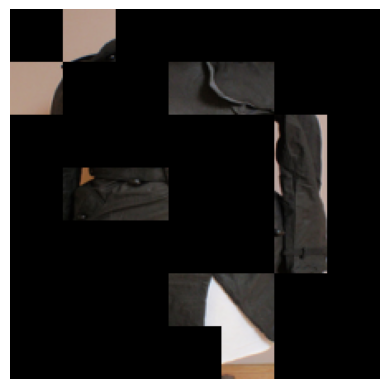

  0%|          | 0/5 [00:00<?, ?it/s]

486


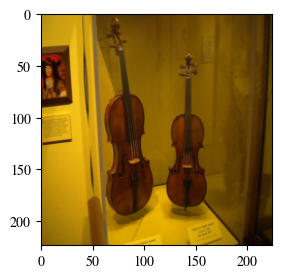

616


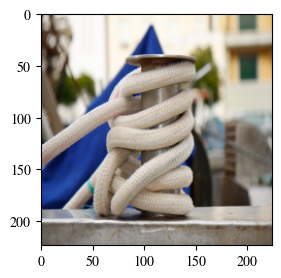

Rank 1: Label ID = 616, Label = knot, Logit = 12.5659, Probability = 0.9834
Rank 2: Label ID = 506, Label = coil, spiral, volute, whorl, helix, Logit = 7.9424, Probability = 0.0097


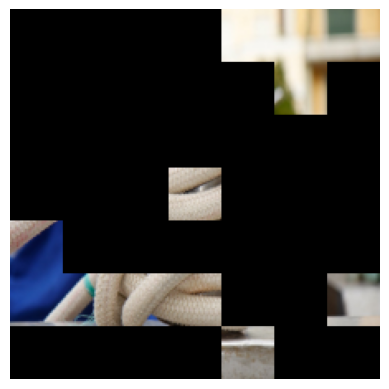

  0%|          | 0/5 [00:00<?, ?it/s]

745


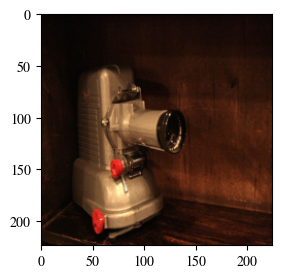

Rank 1: Label ID = 745, Label = projector, Logit = 13.5561, Probability = 0.9924
Rank 2: Label ID = 818, Label = spotlight, spot, Logit = 6.8181, Probability = 0.0012


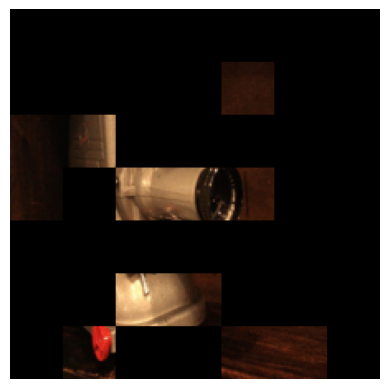

  0%|          | 0/5 [00:00<?, ?it/s]

876


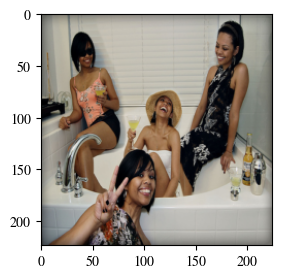

Rank 1: Label ID = 876, Label = tub, vat, Logit = 13.4132, Probability = 0.6984
Rank 2: Label ID = 435, Label = bathtub, bathing tub, bath, tub, Logit = 12.5475, Probability = 0.2938


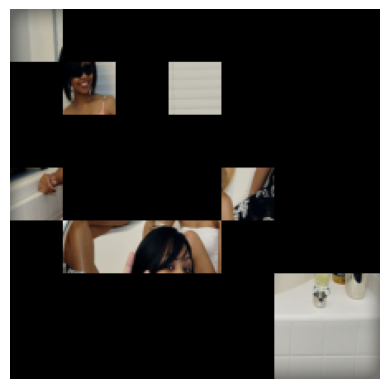

  0%|          | 0/5 [00:00<?, ?it/s]

112


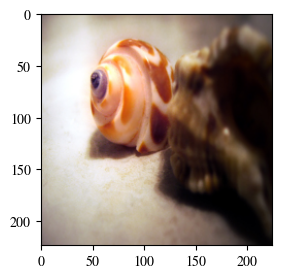

Rank 1: Label ID = 112, Label = conch, Logit = 13.6609, Probability = 0.9878
Rank 2: Label ID = 113, Label = snail, Logit = 8.3323, Probability = 0.0048


KeyboardInterrupt: 

In [27]:
from PIL import Image
import matplotlib.pyplot as plt

intgrad_cand_stability_pass = []
for idx in intgrad_cand_idxs_feas:
    print(idx)
    image = images[idx][None]
    # image = image * 2 - 1
    image_name = f'image_{idx}'
    
    # show image

    # plt.imshow(image[0].cpu().permute(1,2,0))
    plt.figure(figsize=(3,3))
    plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
    plt.show()
    raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
    set_random_seed(42)
    smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
    
    if raw_pred != smooth_pred:
        continue

    # get top_k predictions
    top_k = 2
    top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

    # Print the top k predictions
    for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
        print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")
        
    num_patches=grid_size * grid_size #49
    top_k_frac = 0.25
    
    set_random_seed(42)
    intgrad_expln_alpha, intgrad_expln, intgrad_expln_attrs = get_intgrad_for_image(wrapped_vit, 
                                                                        image[0], return_verbose=True,
                                                                       num_patches=num_patches, top_k_frac=top_k_frac)
    vis_masked_img(image=image.cpu(), alpha=intgrad_expln_alpha.cpu()) 
    
    exp = intgrad_expln_alpha
    set_random_seed(42)
    ss_list = []
    for r in tqdm(range(1, 6)):
    # for r in tqdm(range(0, 196, 10)):
        ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
        ss_list.append(ss)
    
    set_random_seed(42)
    hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
    
    print('soft stability', ss_list)
    print('hard stability radius', hs_radius)
        
    ss_radius = 0
    for r in range(len(ss_list)):
        if r >= 0.9:
            ss_radius += 1
        else:
            break
            
    if np.mean(ss_list) < 1 and hs_radius >= 1 and ss_radius > hs_radius:
        print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
        print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)
        intgrad_cand_stability_pass.append(idx)

In [ ]:
images.min(), images.max()

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

mfaba_cand_stability_pass = []
for idx in mfaba_cand_idxs_feas:
    print(idx)
    image = images[idx][None]
    # image = image * 2 - 1
    image_name = f'image_{idx}'
    
    # show image

    # plt.imshow(image[0].cpu().permute(1,2,0))
    plt.figure(figsize=(3,3))
    plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
    plt.show()
    raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
    set_random_seed(42)
    smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
    
    if raw_pred != smooth_pred:
        continue

    # get top_k predictions
    top_k = 2
    top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

    # Print the top k predictions
    for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
        print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")
        
    num_patches=grid_size * grid_size #49
    top_k_frac = 0.25
    
    set_random_seed(42)
    mfaba_expln_alpha, mfaba_expln, mfaba_expln_attrs = get_mfaba_for_image(wrapped_vit, 
                                                                        image[0], return_verbose=True,
                                                                       num_patches=num_patches, top_k_frac=top_k_frac)
    vis_masked_img(image=image.cpu(), alpha=mfaba_expln_alpha.cpu()) 
    
    exp = mfaba_expln_alpha
    set_random_seed(42)
    ss_list = []
    for r in tqdm(range(1, 6)):
    # for r in tqdm(range(0, 196, 10)):
        ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
        ss_list.append(ss)
    
    set_random_seed(42)
    hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
        
    ss_radius = 0
    for r in range(len(ss_list)):
        if r >= 0.9:
            ss_radius += 1
        else:
            break
            
    if np.mean(ss_list) < 1 and hs_radius >= 1:
        print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
        print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)
        print('soft stability', ss_list)
        print('hard stability radius', hs_radius)
        mfaba_cand_stability_pass.append(idx)

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

lime_cand_stability_pass = []
for idx in lime_cand_idxs_feas:
    print(idx)
    image = images[idx][None]
    image = image * 2 - 1
    image_name = f'image_{idx}'
    
    # show image

    # plt.imshow(image[0].cpu().permute(1,2,0))
    plt.figure(figsize=(3,3))
    plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
    plt.show()
    raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
    set_random_seed(42)
    smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
    print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
    print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)

    # get top_k predictions
    top_k = 2
    top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

    # Print the top k predictions
    for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
        print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")
        
    num_patches=grid_size * grid_size #49
    top_k_frac = 0.25
    
    set_random_seed(42)
    lime_expln_alpha, lime_expln, shap_expln_attrs = get_lime_for_image(wrapped_vit, 
                                                                        image[0], return_verbose=True,
                                                                       num_patches=num_patches, top_k_frac=top_k_frac)
    vis_masked_img(image=image.cpu(), alpha=lime_expln_alpha.cpu()) 
    
    exp = lime_expln_alpha
    set_random_seed(42)
    ss_list = []
    # for r in tqdm(range(1, 6)):
    for r in tqdm(range(0, 196, 10)):
        ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
        ss_list.append(ss)
    print('soft stability', ss_list)
    set_random_seed(42)
    hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
    print('hard stability radius', hs_radius)
    
    if np.mean(ss_list) < 1 and hs_radius >= 1:
        lime_cand_stability_pass.append(idx)

# Dog

In [253]:
# cand_idxs[3] 384

In [16]:
# idx = cand_idxs_feas[3] #sorted_indices[6] #457 #image_idxs[2].item() #sorted_indices[6] #, all_predictions[100] 3 6
idx = 166
print(idx)
image = images[idx][None]
# image = image * 2 - 1
image_name = f'image_{idx}'

166


In [17]:
# need:
# hard stability >= 1
# soft stability <= 5
# at least one alpha not stable

# shap: 530, 916, 574, 985, 459, 945, 733, 644, 463, 950, 789, 952, 685, 680

torch.Size([1, 3, 224, 224])
raw_pred Walker hound, Walker foxhound 166
smooth_pred Walker hound, Walker foxhound 166
Rank 1: Label ID = 166, Label = Walker hound, Walker foxhound, Logit = 14.3362, Probability = 0.8807
Rank 2: Label ID = 167, Label = English foxhound, Logit = 12.2487, Probability = 0.1092
Rank 3: Label ID = 162, Label = beagle, Logit = 8.4554, Probability = 0.0025
Rank 4: Label ID = 158, Label = toy terrier, Logit = 8.4516, Probability = 0.0025
Rank 5: Label ID = 188, Label = wire-haired fox terrier, Logit = 7.4139, Probability = 0.0009
Rank 6: Label ID = 161, Label = basset, basset hound, Logit = 7.3781, Probability = 0.0008
Rank 7: Label ID = 164, Label = bluetick, Logit = 7.0413, Probability = 0.0006
Rank 8: Label ID = 253, Label = basenji, Logit = 6.5318, Probability = 0.0004
Rank 9: Label ID = 165, Label = black-and-tan coonhound, Logit = 6.1356, Probability = 0.0002
Rank 10: Label ID = 163, Label = bloodhound, sleuthhound, Logit = 5.8486, Probability = 0.0002


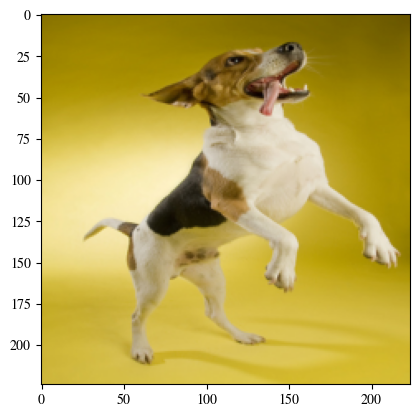

In [18]:
from PIL import Image
import matplotlib.pyplot as plt

# plt.imshow(image[0].cpu().permute(1,2,0))
plt.imshow((image[0].cpu().permute(1,2,0) + 1) /2)
raw_pred = wrapped_vit(image.cuda()).argmax(-1).item()
set_random_seed(42)
smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
print(image.shape)
print('raw_pred', raw_vit.config.id2label[raw_pred], raw_pred)
print('smooth_pred', raw_vit.config.id2label[smooth_pred], smooth_pred)

# get top_k predictions
top_k = 10
top_k_preds = get_top_k_predictions(wrapped_vit, image, raw_vit, k=top_k)

# Print the top k predictions
for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
    print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")

In [19]:
# r = 0.25
num_patches=grid_size * grid_size #49
top_k_frac = 0.25

  0%|          | 0/1000 [00:00<?, ?it/s]

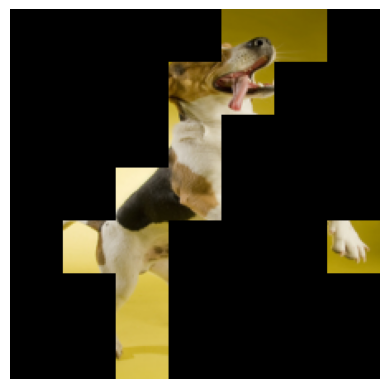

In [20]:
set_random_seed(42)
lime_expln_alpha, lime_expln, lime_expln_attrs = get_lime_for_image(wrapped_vit, 
                                                                    image[0], return_verbose=True,
                                                                   num_patches=num_patches, top_k_frac=top_k_frac)
vis_masked_img(image=image.cpu(), alpha=lime_expln_alpha.cpu()) 

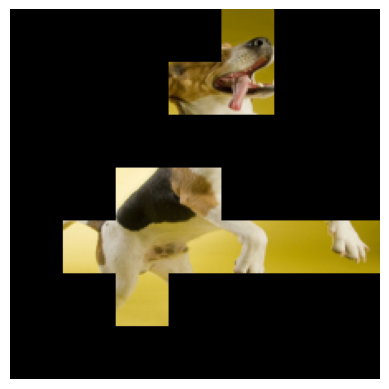

In [139]:
# set_random_seed(42)
# shap_expln_alpha, shap_expln, shap_expln_attrs = get_shap_for_image(wrapped_vit, 
#                                                                     image[0], return_verbose=True,
#                                                                    num_patches=num_patches, top_k_frac=top_k_frac)
# vis_masked_img(image=image.cpu(), alpha=shap_expln_alpha.cpu()) 

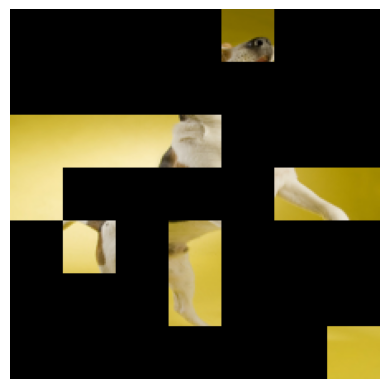

In [140]:
# set_random_seed(42)
# intgrad_expln_alpha, intgrad_expln, intgrad_expln_attrs = get_intgrad_for_image(wrapped_vit, 
#                                                                     image[0], return_verbose=True,
#                                                                    num_patches=num_patches, top_k_frac=top_k_frac)
# vis_masked_img(image=image.cpu(), alpha=intgrad_expln_alpha.cpu()) 

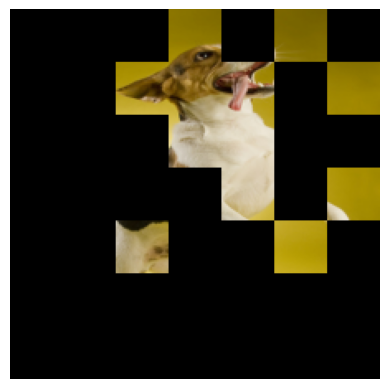

In [141]:
# set_random_seed(42)
# mfaba_expln_alpha, mfaba_expln, mfaba_expln_attrs = get_mfaba_for_image(wrapped_vit, 
#                                 image[0], return_verbose=True,
#                                 num_patches=num_patches, top_k_frac=top_k_frac)
# vis_masked_img(image=image.cpu(), alpha=mfaba_expln_alpha.cpu()) 

In [21]:
exp = lime_expln_alpha

ss_list = []
for r in range(1, 6):
    set_random_seed(42)
    ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
    ss_list.append(ss)
print('soft stability', ss_list)
hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
print('hard stability radius', hs_radius)

soft stability [0.8533333539962769, 0.8600000143051147, 0.9466667175292969, 0.9466667175292969, 0.9600000381469727]
hard stability radius tensor([0.0859], device='cuda:0')


In [143]:
# exp = shap_expln_alpha

# ss_list = []
# for r in tqdm(range(1, 6)):
# # for r in tqdm(range(0, 196, 10)):
#     set_random_seed(42)
#     ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
#     ss_list.append(ss)
# print('soft stability', ss_list)
# set_random_seed(42)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

  0%|          | 0/5 [00:00<?, ?it/s]

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.0742], device='cuda:0')


In [144]:
# set_random_seed(1)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

hard stability radius tensor([0.1797], device='cuda:0')


In [145]:
# set_random_seed(2)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

hard stability radius tensor([0.3789], device='cuda:0')


In [146]:
# set_random_seed(3)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

hard stability radius tensor([0.1289], device='cuda:0')


In [147]:
# set_random_seed(4)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

hard stability radius tensor([0.3359], device='cuda:0')


In [148]:
# exp = intgrad_expln_alpha

# ss_list = []
# for r in range(1, 6):
#     set_random_seed(42)
#     ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
#     ss_list.append(ss)
# print('soft stability', ss_list)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

soft stability [0.0533333346247673, 0.013333333656191826, 0.0, 0.0, 0.0]
hard stability radius tensor([0.5859], device='cuda:0')


In [91]:
# exp = mfaba_expln_alpha

# ss_list = []
# for r in range(1, 6):
#     set_random_seed(42)
#     ss = soft_stability_rate(wrapped_vit, image[0].to(device), exp.to(device), r, epsilon=0.1).item()
#     ss_list.append(ss)
# print('soft stability', ss_list)
# hs_radius = cert_mus_vit(image.to(device), alpha=exp.to(device))["cert_rs"]
# print('hard stability radius', hs_radius)

soft stability [1.0, 1.0, 1.0, 1.0, 1.0]
hard stability radius tensor([0.2422], device='cuda:0')


# Save masked images

In [23]:
import os
save_dir = f'_fig_images/masked/{image_name}_gs{grid_size}'
os.makedirs(save_dir, exist_ok=True)

In [24]:
r = 4
# exp_mapping = {
#     'lime': lime_expln_alpha,
#     'shap': shap_expln_alpha,
#     'intgrad': intgrad_expln_alpha,
#     'mfaba': mfaba_expln_alpha
# }
exp_name = 'lime'
# alpha = exp_mapping[exp_name]
alpha = lime_expln_alpha

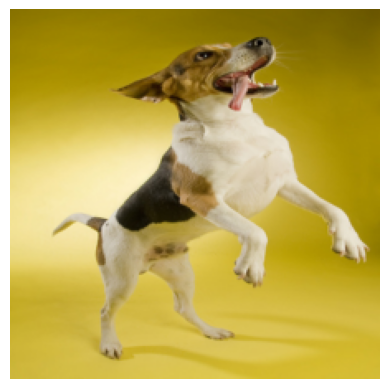

In [25]:
plt.imshow((image[0].permute(1,2,0) + 1)/2)
plt.axis('off')
plt.savefig(os.path.join(save_dir, f'{exp_name}_original.png'), 
    dpi=300, bbox_inches='tight', pad_inches=0)

In [26]:
vis_masked_img(image=image.cpu(), alpha=alpha.cpu(),
            save_path=os.path.join(save_dir, 
                f'{exp_name}_alpha{alpha.sum().item()}.png'))

In [27]:
import math
from stability import sample_alpha_pertbs
@torch.no_grad()
def soft_stability_rate_with_alphas(
    f,
    x: torch.FloatTensor,
    alpha: torch.LongTensor,
    radius: int,
    epsilon: float = 0.1,
    delta: float = 0.1,
    batch_size: int = 16,
    return_all: bool = False,
):
    """
    Measure the soft stability rate for a classifier of form y = f(x, alpha), where:

        soft_stability_rate = Pr_{alpha' ~ Delta_r} [f(x, alpha') == f(x, alpha)]

    Args:
        f: Any function (ideally nn.Module) that takes as input x, alpha.
        x: The input to f of some shape. NOT batched.
        alpha: The 0/1 attribution of some shape. NOT batched.
        radius: The radius to which we give the guarantee.
        epsilon: The error tolerance.
        delta: The admissible failure probability
        batch_size: The batch size in case we run out-of-memory.
        return_all: Return all the intermediate information in a dictionary.

    Returns:
        soft_stability_rate: A value between 0 and 1.
    """
    C, H, W = x.shape
    y = f(x.view(1,C,H,W), alpha.unsqueeze(0)) # Reference prediction

    N = int(math.log(2/delta) / (2 * (epsilon**2))) + 1
    all_y_pertbs = []
    all_alpha_pertbs = []

    for alpha_pertbs in torch.split(sample_alpha_pertbs(alpha, radius, N), batch_size):
        repeat_pattern = [1] * (1 + x.ndim)
        repeat_pattern[0] = alpha_pertbs.size(0)
        y_pertbs = f(x.unsqueeze(0).repeat(*repeat_pattern), alpha_pertbs)
        all_y_pertbs.append(y_pertbs)
        all_alpha_pertbs.append(alpha_pertbs)

    all_y_pertbs = torch.cat(all_y_pertbs, dim=0)
    soft_stab_rate = (y.argmax(dim=-1) == all_y_pertbs.argmax(dim=-1)).float().mean()
    all_alpha_pertbs = torch.cat(all_alpha_pertbs, dim=0)
    
    if return_all:
        return {
            "soft_stability_rate": soft_stab_rate,
            "y": y[0],
            "y_pertbs": all_y_pertbs,
            'alpha_pertbs': all_alpha_pertbs
        }

    else:
        return soft_stab_rate

In [28]:
set_random_seed(0)
ss_dict = soft_stability_rate_with_alphas(wrapped_vit, image[0].to(device), alpha.to(device), r, epsilon=0.1,
                                    return_all=True)

In [29]:
ss_dict['alpha_pertbs'].shape, ss_dict['y_pertbs'].shape

(torch.Size([150, 1, 7, 7]), torch.Size([150, 1000]))

In [30]:
r, set(ss_dict['y_pertbs'].argmax(-1).tolist())

(4, {162, 166})

In [31]:
ss_dict['y_pertbs'].argmax(-1).tolist().count(162), ss_dict['y_pertbs'].argmax(-1).tolist().count(166)

(11, 139)

In [32]:
raw_vit.config.id2label[162], raw_vit.config.id2label[166]

('beagle', 'Walker hound, Walker foxhound')

In [33]:
wrong_idx1 = ss_dict['y_pertbs'].argmax(-1).tolist().index(162)
wrong_idx1

12

In [34]:
# wrong_idx2 = ss_dict['y_pertbs'].argmax(-1).tolist().index(960)
# wrong_idx2

In [35]:
ss_dict['alpha_pertbs'].sum(-1).sum(-1).view(-1).tolist().index(14), ss_dict['alpha_pertbs'].sum(-1).sum(-1).view(-1).tolist().index(15), ss_dict['alpha_pertbs'].sum(-1).sum(-1).view(-1).tolist().index(16)

(128, 2, 0)

In [36]:
alphas_idxs = torch.tensor([128,2,wrong_idx1,0,50,100,149]).to(device)
alphas_plot = ss_dict['alpha_pertbs'][alphas_idxs]

In [37]:
alpha.sum()

tensor(12., device='cuda:0')

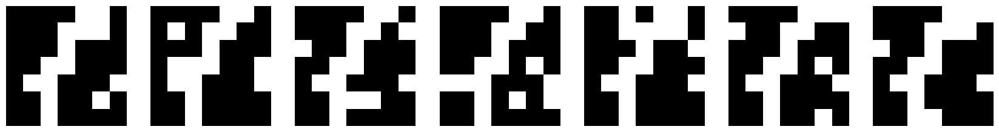

In [38]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 7, figsize=(3*7, 3))
for i in range(len(axs)):
    axs[i].imshow(alphas_plot[i][0].cpu(), cmap='gray')
    axs[i].axis('off')

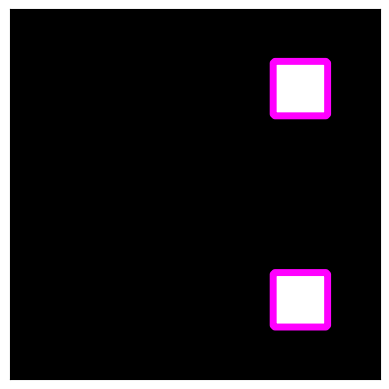

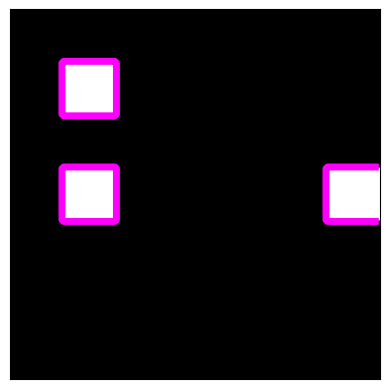

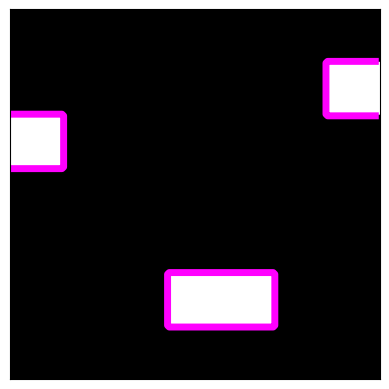

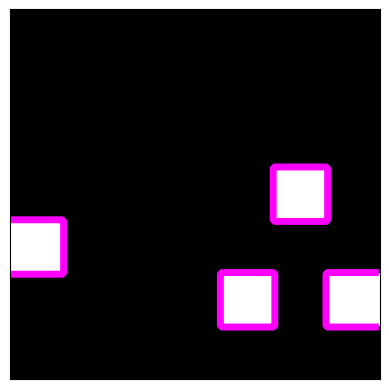

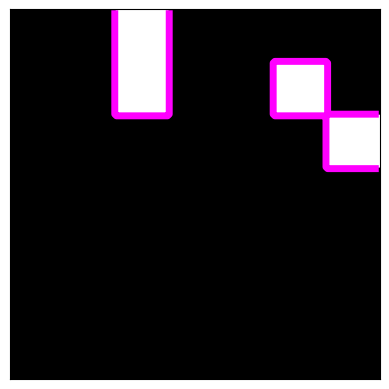

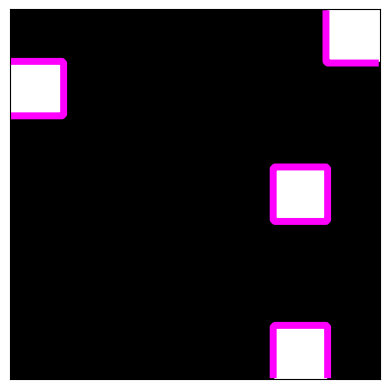

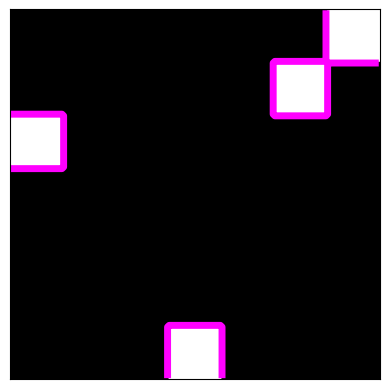

In [40]:
import numpy as np
import torch.nn.functional as F
os.makedirs(os.path.join(save_dir, 'masks_only_add'), exist_ok=True)
for i in range(len(alphas_plot)):
    plt.figure()
    mask = F.interpolate(alphas_plot[i:i+1].float().cpu(), size=(224, 224))
    # plt.imshow(mask[0][0].cpu(), cmap='gray')
    diff_mask = (alphas_plot[i][0].cpu() - alpha.cpu())
    contour_levels = np.linspace(diff_mask.numpy().min(), diff_mask.numpy().max(), 10)
    diff_mask_large = F.interpolate(diff_mask[None].float().cpu(), size=(224, 224))[0][0]
    plt.imshow(diff_mask_large, cmap='gray')
    plt.contour(diff_mask_large, levels=[0], colors='#ff00ff', linewidths=5)
    # plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.savefig(os.path.join(save_dir, 'masks_only_add', f'rand_mask{i}.png'), dpi=300, bbox_inches='tight', pad_inches=0)

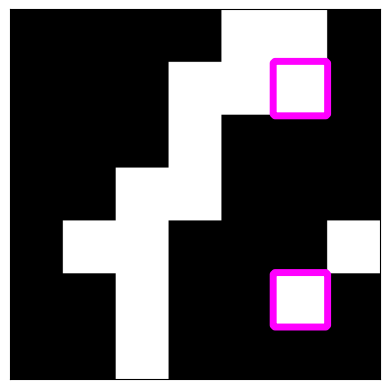

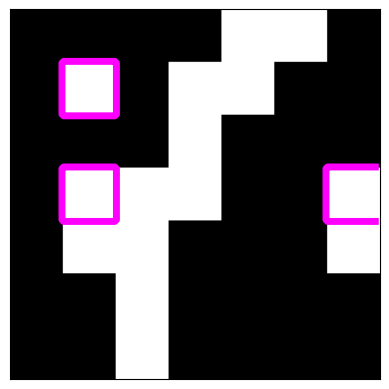

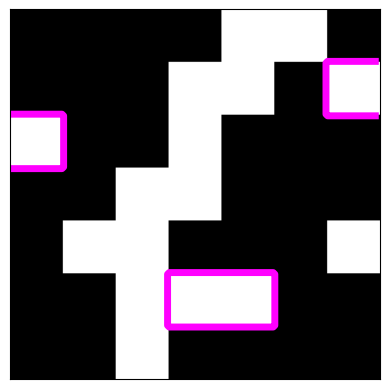

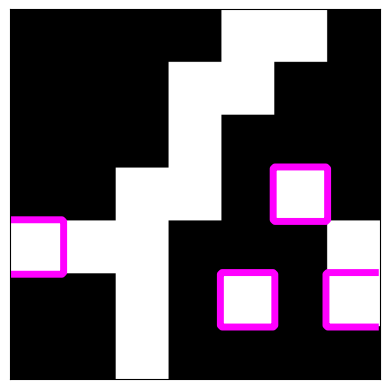

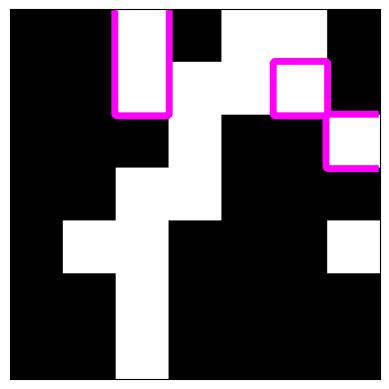

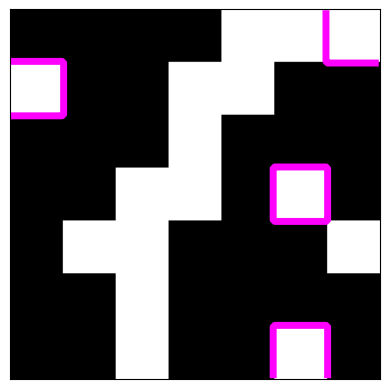

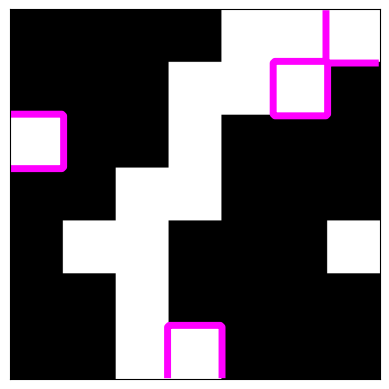

In [41]:
import numpy as np
import torch.nn.functional as F
os.makedirs(os.path.join(save_dir, 'masks_only'), exist_ok=True)
for i in range(len(alphas_plot)):
    plt.figure()
    mask = F.interpolate(alphas_plot[i:i+1].float().cpu(), size=(224, 224))
    plt.imshow(mask[0][0].cpu(), cmap='gray')
    diff_mask = (alphas_plot[i][0].cpu() - alpha.cpu())
    contour_levels = np.linspace(diff_mask.numpy().min(), diff_mask.numpy().max(), 10)
    diff_mask_large = F.interpolate(diff_mask[None].float().cpu(), size=(224, 224))[0][0]
    plt.contour(diff_mask_large, levels=[0], colors='#ff00ff', linewidths=5)
    # plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.savefig(os.path.join(save_dir, 'masks_only', f'rand_mask{i}.png'), dpi=300, bbox_inches='tight', pad_inches=0)

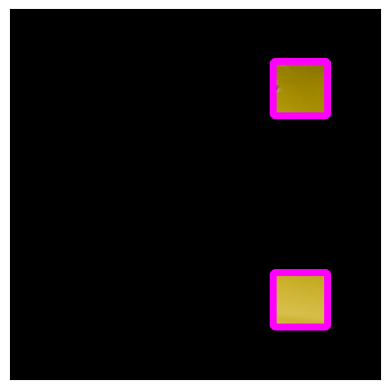

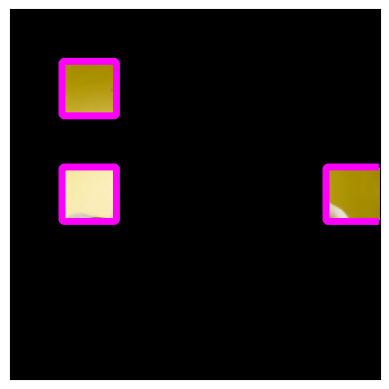

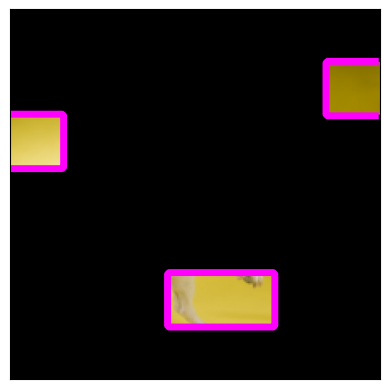

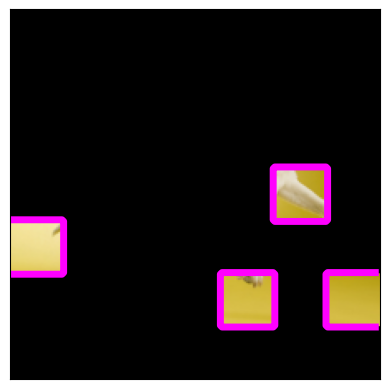

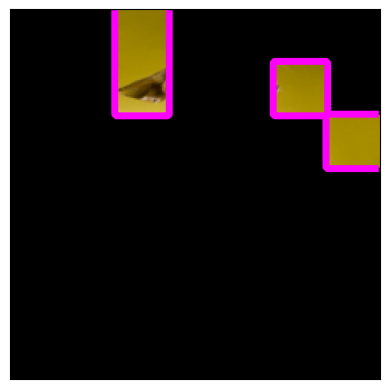

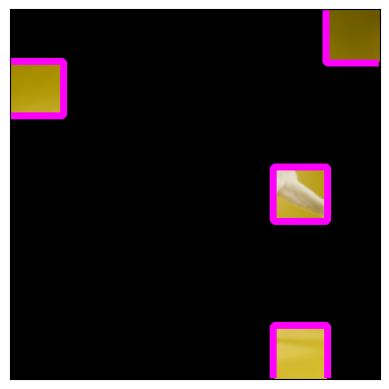

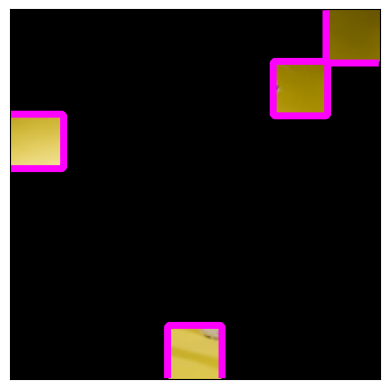

In [42]:
import torch.nn.functional as F
os.makedirs(os.path.join(save_dir, 'masks_n_img_add'), exist_ok=True)
for i in range(len(alphas_plot)):
    plt.figure()
    mask = F.interpolate(alphas_plot[i:i+1].float().cpu(), size=(224, 224))
    # print('mask', mask.shape)
    # print('image', image.shape)
    # plt.imshow(((image.cpu() + 1) / 2 * mask.cpu())[0].permute(1,2,0).cpu())
    diff_mask = (alphas_plot[i][0].cpu() - alpha.cpu())
    contour_levels = np.linspace(diff_mask.numpy().min(), diff_mask.numpy().max(), 10)
    diff_mask_large = F.interpolate(diff_mask[None].float().cpu(), size=(224, 224))[0][0]
    plt.imshow(((image.cpu() + 1) / 2 * diff_mask_large.cpu())[0].permute(1,2,0).cpu())
    plt.contour(diff_mask_large, levels=[0], colors='#ff00ff', linewidths=5)
    plt.xticks([])
    plt.yticks([])
    plt.savefig(os.path.join(save_dir, 'masks_n_img_add', f'rand_mask{i}.png'), dpi=300, bbox_inches='tight', pad_inches=0)

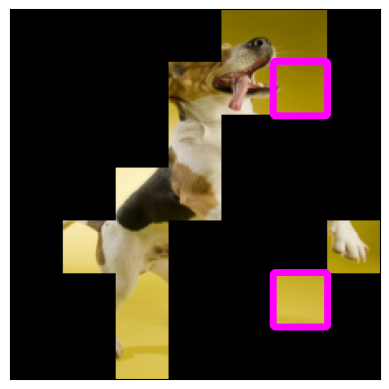

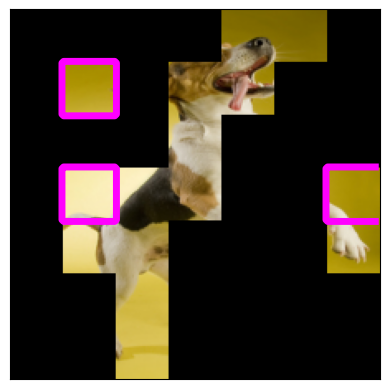

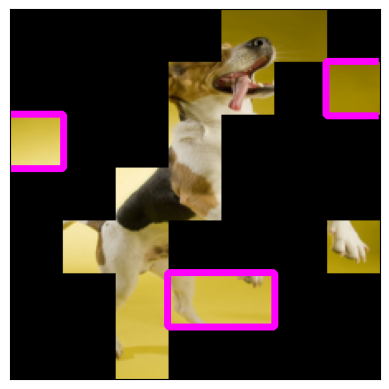

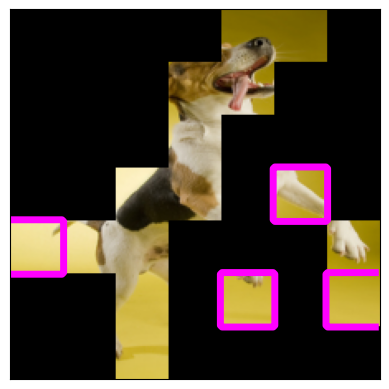

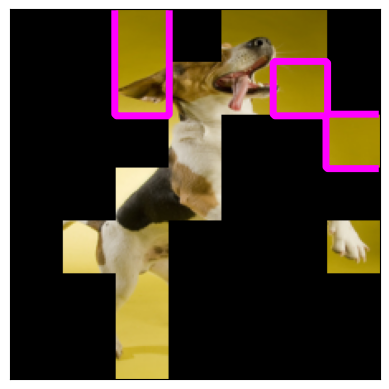

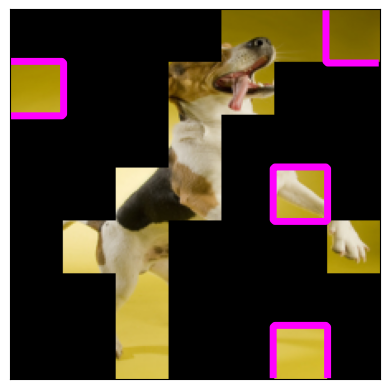

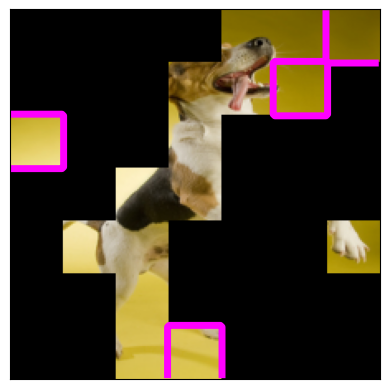

In [43]:
import torch.nn.functional as F
os.makedirs(os.path.join(save_dir, 'masks_n_img'), exist_ok=True)
for i in range(len(alphas_plot)):
    plt.figure()
    mask = F.interpolate(alphas_plot[i:i+1].float().cpu(), size=(224, 224))
    # print('mask', mask.shape)
    # print('image', image.shape)
    plt.imshow(((image.cpu() + 1) / 2 * mask.cpu())[0].permute(1,2,0).cpu())
    diff_mask = (alphas_plot[i][0].cpu() - alpha.cpu())
    contour_levels = np.linspace(diff_mask.numpy().min(), diff_mask.numpy().max(), 10)
    diff_mask_large = F.interpolate(diff_mask[None].float().cpu(), size=(224, 224))[0][0]
    plt.contour(diff_mask_large, levels=[0], colors='#ff00ff', linewidths=5)
    plt.xticks([])
    plt.yticks([])
    plt.savefig(os.path.join(save_dir, 'masks_n_img', f'rand_mask{i}.png'), dpi=300, bbox_inches='tight', pad_inches=0)

In [226]:
alpha.shape

torch.Size([1, 7, 7])

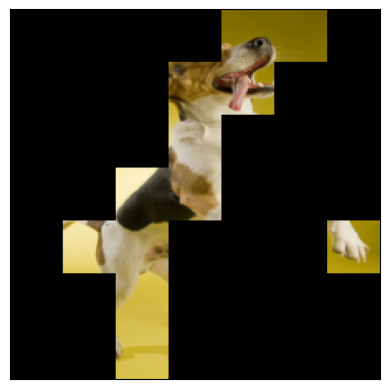

In [227]:
import torch.nn.functional as F
os.makedirs(os.path.join(save_dir, 'masks_n_img'), exist_ok=True)
# for i in range(len(alphas_plot)):
plt.figure()
mask = F.interpolate(alpha[None].float().cpu(), size=(224, 224))
# print('mask', mask.shape)
# print('image', image.shape)
plt.imshow(((image.cpu() + 1) / 2 * mask.cpu())[0].permute(1,2,0).cpu())
plt.xticks([])
plt.yticks([])
plt.savefig(os.path.join(save_dir, 'masks_n_img', f'rand_mask_{exp_name}.png'), dpi=300, bbox_inches='tight', pad_inches=0)

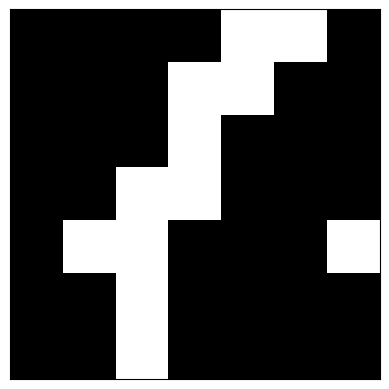

In [228]:
os.makedirs(os.path.join(save_dir, 'masks_only'), exist_ok=True)
# for i in range(len(alphas_plot)):
plt.figure()
plt.imshow(alpha[0].cpu(), cmap='gray')
# plt.axis('off')
plt.xticks([])
plt.yticks([])
plt.savefig(os.path.join(save_dir, 'masks_only', f'rand_mask_{exp_name}.png'), dpi=300, bbox_inches='tight', pad_inches=0)

In [201]:
alpha_add1 = add_k_ones_enumerate(alpha, k=1)

In [1295]:
alpha_add1, alpha

([tensor([[[1., 1., 1.],
           [0., 1., 0.],
           [0., 1., 0.]]], device='cuda:0'),
  tensor([[[0., 1., 1.],
           [1., 1., 0.],
           [0., 1., 0.]]], device='cuda:0'),
  tensor([[[0., 1., 1.],
           [0., 1., 1.],
           [0., 1., 0.]]], device='cuda:0'),
  tensor([[[0., 1., 1.],
           [0., 1., 0.],
           [1., 1., 0.]]], device='cuda:0'),
  tensor([[[0., 1., 1.],
           [0., 1., 0.],
           [0., 1., 1.]]], device='cuda:0')],
 tensor([[[0., 1., 1.],
          [0., 1., 0.],
          [0., 1., 0.]]], device='cuda:0'))

In [1296]:
wrapped_vit_pred = wrapped_vit(image.to(device), alpha.to(device)).argmax(-1).item()
cert_mus_vit_pred = cert_mus_vit(image.to(device), alpha.to(device))['logits'].argmax(-1).item()
wrapped_vit_pred, cert_mus_vit_pred

(145, 145)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 3, 224, 224])
raw_pred Walker hound, Walker foxhound
smooth_pred Walker hound, Walker foxhound
Rank 1: Label ID = 166, Label = Walker hound, Walker foxhound, Logit = 14.3362, Probability = 0.8807
Rank 2: Label ID = 167, Label = English foxhound, Logit = 12.2487, Probability = 0.1092
Rank 3: Label ID = 162, Label = beagle, Logit = 8.4554, Probability = 0.0025
Rank 4: Label ID = 158, Label = toy terrier, Logit = 8.4516, Probability = 0.0025
Rank 5: Label ID = 188, Label = wire-haired fox terrier, Logit = 7.4139, Probability = 0.0009
Rank 6: Label ID = 161, Label = basset, basset hound, Logit = 7.3781, Probability = 0.0008
Rank 7: Label ID = 164, Label = bluetick, Logit = 7.0413, Probability = 0.0006
Rank 8: Label ID = 253, Label = basenji, Logit = 6.5318, Probability = 0.0004
Rank 9: Label ID = 165, Label = black-and-tan coonhound, Logit = 6.1356, Probability = 0.0002
Rank 10: Label ID = 163, Label = bloodhound, sleuthhound, Logit = 5.8486, Probability = 0.0002


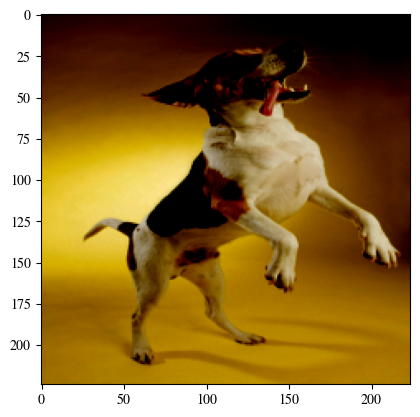

In [232]:
from PIL import Image
import matplotlib.pyplot as plt

# alpha_k1_i3 = add_k_ones_enumerate(alpha, k=1)[3][None]
alpha_show = alpha
# alpha_show = alphas_plot[2].float()
masked_image = image
# masked_image = image.to(device) * F.interpolate(alpha_show[None].to(device), size=(224, 224))

# plt.imshow(image[0].cpu().permute(1,2,0))
plt.imshow((masked_image[0].cpu().permute(1,2,0))) # + 1) /2)
raw_pred = wrapped_vit(image.cuda(), alpha_show[0]).argmax(-1).item()
set_random_seed(42)
smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
print(image.shape)
print('raw_pred', raw_vit.config.id2label[raw_pred])
print('smooth_pred', raw_vit.config.id2label[smooth_pred])

# get top_k predictions
top_k = 10
top_k_preds = get_top_k_predictions(wrapped_vit, 
                                    masked_image, raw_vit, k=top_k)

# Print the top k predictions
for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
    print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

def vis_masks(image: torch.Tensor, alpha: torch.Tensor, ax=plt, save_path=None, 
                   alpha_original: torch.Tensor = None, linewidths=5):
    """
    Visualize an image with an overlaid transparency mask and optional contour for difference.
    
    Args:
        image (torch.Tensor): Shape (1, 3, 224, 224), normalized in range [-1, 1].
        alpha (torch.Tensor): Shape (1, num_patches, num_patches).
        ax: Matplotlib axis or plt itself.
        save_path (str, optional): If provided, saves the figure to this path.
        alpha_original (torch.Tensor, optional): Original alpha for computing the difference.
    """
    image = torch.ones_like(image)
    mask = F.interpolate(alpha[:, None], size=(224, 224)).cpu()[0, 0]
    
    if alpha_original is not None:
        mask_original = F.interpolate(alpha_original[:, None], size=(224, 224)).cpu()[0, 0]
        diff_mask = (mask - mask_original).numpy()
    else:
        diff_mask = None
    
    if ax == plt:
        plt.figure()
    
    ax.imshow(((image[0] + 1) / 2 * mask).cpu().permute(1, 2, 0))
    ax.axis('off')
    
    # print('diff_mask', diff_mask)
    # print('mask_original', mask_original)
    
    # Draw contour if alpha_original is provided
    if diff_mask is not None:
        contour_levels = np.linspace(diff_mask.min(), diff_mask.max(), 10)
        ax.contour(diff_mask, levels=[0], colors='yellow', linewidths=linewidths)
    
    if save_path is not None:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()
        
vis_masks(image=image.cpu(), alpha=alpha_add.cpu())

In [1328]:
def vis_masked_img(image: torch.Tensor, alpha: torch.Tensor, ax=plt, save_path=None, alpha_original: torch.Tensor = None, linewidths=5):
    """
    Visualize an image with an overlaid transparency mask and optional contour for difference.
    
    Args:
        image (torch.Tensor): Shape (1, 3, 224, 224), normalized in range [-1, 1].
        alpha (torch.Tensor): Shape (1, num_patches, num_patches).
        ax: Matplotlib axis or plt itself.
        save_path (str, optional): If provided, saves the figure to this path.
        alpha_original (torch.Tensor, optional): Original alpha for computing the difference.
    """
    mask = F.interpolate(alpha[:, None], size=(224, 224)).cpu()[0, 0]
    
    if alpha_original is not None:
        mask_original = F.interpolate(alpha_original[:, None], size=(224, 224)).cpu()[0, 0]
        diff_mask = (mask - mask_original).numpy()
    else:
        diff_mask = None
    
    if ax == plt:
        plt.figure()
    
    ax.imshow(((image[0] + 1) / 2 * mask).cpu().permute(1, 2, 0))
    ax.axis('off')
    
    # print('diff_mask', diff_mask)
    # print('mask_original', mask_original)
    
    # Draw contour if alpha_original is provided
    if diff_mask is not None:
        contour_levels = np.linspace(diff_mask.min(), diff_mask.max(), 10)
        ax.contour(diff_mask, levels=[0], colors='yellow', linewidths=linewidths)
    
    if save_path is not None:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close()
    else:
        plt.show()

In [1303]:
# compute pred
preds = []
wrapped_preds = []
cert_mus_preds = []
for k in range(1, 6):
    print('k', k)
    # try:
    alpha_add_k = add_k_ones_enumerate(alpha, k=k)
    # except:
    #     alpha_add_k = torch.ones_like(alpha)
    for i, alpha_add in tqdm(enumerate(alpha_add_k)):
        vis_masked_img(image=image.cpu(), alpha=alpha_add.cpu(), alpha_original=alpha.cpu(),
                      save_path=os.path.join(save_dir, 
                        f'{exp_name}_alpha{alpha.sum().item()}_k{k}_i{i}.png'), linewidths=15)
        vis_masks(image=image.cpu(), alpha=alpha_add.cpu(), alpha_original=alpha.cpu(),
                      save_path=os.path.join(save_dir, 
                        f'{exp_name}_alpha{alpha.sum().item()}_k{k}_i{i}_mask.png'), linewidths=15)
        wrapped_vit_pred = wrapped_vit(image.to(device), alpha_add.to(device)).argmax(-1).item()
        cert_mus_vit_pred = cert_mus_vit(image.to(device), alpha_add.to(device))['logits'].argmax(-1).item()
        preds.append(tuple([k, i, wrapped_vit_pred, cert_mus_vit_pred]))
        wrapped_preds.append(wrapped_vit_pred)
        cert_mus_preds.append(cert_mus_vit_pred)
        
#         if len(set(wrapped_preds)) > 1:
#             print('wrap')
#             break
        
#         if len(set(cert_mus_preds)) > 1:
#             print('cert')
#             break
        
        # print(i, 'wrapped_vit', wrapped_vit(image.to(device), alpha_add.to(device)).argmax(-1))
        # print(i, 'cert_mus_vit', cert_mus_vit(image.to(device), alpha_add.to(device))['logits'].argmax(-1))

k 1


0it [00:00, ?it/s]

k 2


0it [00:00, ?it/s]

k 3


0it [00:00, ?it/s]

k 4


0it [00:00, ?it/s]

k 5


0it [00:00, ?it/s]

In [1302]:
preds

[(1, 0, 145, 145),
 (1, 1, 145, 145),
 (1, 2, 145, 145),
 (1, 3, 145, 145),
 (1, 4, 145, 145),
 (2, 0, 145, 145),
 (2, 1, 145, 145),
 (2, 2, 145, 145),
 (2, 3, 145, 145),
 (2, 4, 145, 145),
 (2, 5, 145, 145),
 (2, 6, 145, 145),
 (2, 7, 145, 145),
 (2, 8, 145, 145),
 (2, 9, 145, 145),
 (3, 0, 145, 145),
 (3, 1, 145, 145),
 (3, 2, 145, 145),
 (3, 3, 145, 145),
 (3, 4, 145, 145),
 (3, 5, 145, 145),
 (3, 6, 145, 145),
 (3, 7, 145, 145),
 (3, 8, 145, 145),
 (3, 9, 145, 145),
 (4, 0, 145, 145),
 (4, 1, 145, 145),
 (4, 2, 145, 145),
 (4, 3, 145, 145),
 (4, 4, 145, 145),
 (5, 0, 145, 145)]

In [879]:
# cert_mus_preds

[763, 763, 574, 574, 574]

In [1224]:
cert_mus_preds, wrapped_preds

([145, 145, 763, 145, 145], [145, 145, 145, 145, 145])

In [522]:
set([pred[1].item() for pred in preds])

{145}

In [1277]:
alpha_add = add_k_ones_enumerate(alpha, k=2)[5]
alpha_add

tensor([[[1., 1., 0.],
         [0., 1., 0.],
         [0., 0., 1.]]], device='cuda:0')

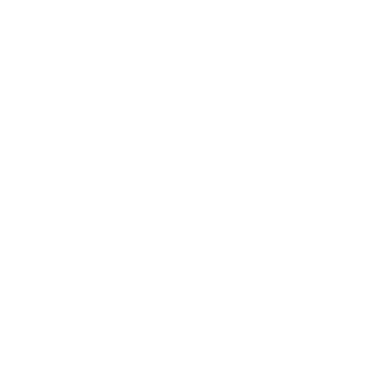

In [1283]:
alpha_add, alpha

(tensor([[[1., 1., 0.],
          [0., 1., 0.],
          [0., 0., 1.]]], device='cuda:0'),
 tensor([[[0., 1., 0.],
          [0., 1., 0.],
          [0., 0., 0.]]], device='cuda:0'))

In [252]:
(image * F.interpolate(alpha_k2_i5, size=(224, 224))).shape

NameError: name 'F' is not defined

torch.Size([1, 3, 224, 224])
raw_pred coucal
smooth_pred revolver, six-gun, six-shooter
Rank 1: Label ID = 91, Label = coucal, Logit = 11.4892, Probability = 0.5752
Rank 2: Label ID = 95, Label = jacamar, Logit = 11.1120, Probability = 0.3945
Rank 3: Label ID = 379, Label = howler monkey, howler, Logit = 7.0684, Probability = 0.0069
Rank 4: Label ID = 16, Label = bulbul, Logit = 5.9474, Probability = 0.0023
Rank 5: Label ID = 94, Label = hummingbird, Logit = 5.8717, Probability = 0.0021
Rank 6: Label ID = 96, Label = toucan, Logit = 5.7525, Probability = 0.0019
Rank 7: Label ID = 364, Label = three-toed sloth, ai, Bradypus tridactylus, Logit = 5.3720, Probability = 0.0013
Rank 8: Label ID = 380, Label = titi, titi monkey, Logit = 5.0904, Probability = 0.0010
Rank 9: Label ID = 92, Label = bee eater, Logit = 4.8468, Probability = 0.0008
Rank 10: Label ID = 18, Label = magpie, Logit = 4.6497, Probability = 0.0006


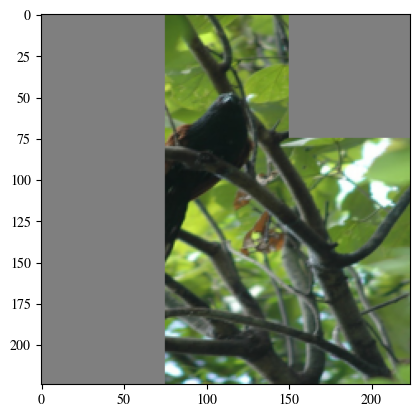

In [426]:
from PIL import Image
import matplotlib.pyplot as plt

alpha_k1_i3 = add_k_ones_enumerate(alpha, k=1)[3][None]
masked_image = image.to(device) * F.interpolate(alpha_k1_i3.to(device), size=(224, 224))

# plt.imshow(image[0].cpu().permute(1,2,0))
plt.imshow((masked_image[0].cpu().permute(1,2,0) + 1) /2)
raw_pred = wrapped_vit(image.cuda(), alpha_k1_i3[0]).argmax(-1).item()
set_random_seed(42)
smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
print(image.shape)
print('raw_pred', raw_vit.config.id2label[raw_pred])
print('smooth_pred', raw_vit.config.id2label[smooth_pred])

# get top_k predictions
top_k = 10
top_k_preds = get_top_k_predictions(wrapped_vit, 
                                    masked_image, raw_vit, k=top_k)

# Print the top k predictions
for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
    print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")

torch.Size([1, 3, 224, 224])
raw_pred jacamar
smooth_pred revolver, six-gun, six-shooter
Rank 1: Label ID = 95, Label = jacamar, Logit = 11.5733, Probability = 0.4957
Rank 2: Label ID = 91, Label = coucal, Logit = 11.5361, Probability = 0.4776
Rank 3: Label ID = 379, Label = howler monkey, howler, Logit = 7.3062, Probability = 0.0070
Rank 4: Label ID = 380, Label = titi, titi monkey, Logit = 5.8738, Probability = 0.0017
Rank 5: Label ID = 96, Label = toucan, Logit = 5.8711, Probability = 0.0017
Rank 6: Label ID = 16, Label = bulbul, Logit = 5.7580, Probability = 0.0015
Rank 7: Label ID = 364, Label = three-toed sloth, ai, Bradypus tridactylus, Logit = 5.5600, Probability = 0.0012
Rank 8: Label ID = 94, Label = hummingbird, Logit = 5.5009, Probability = 0.0011
Rank 9: Label ID = 92, Label = bee eater, Logit = 5.0754, Probability = 0.0007
Rank 10: Label ID = 382, Label = squirrel monkey, Saimiri sciureus, Logit = 4.7502, Probability = 0.0005


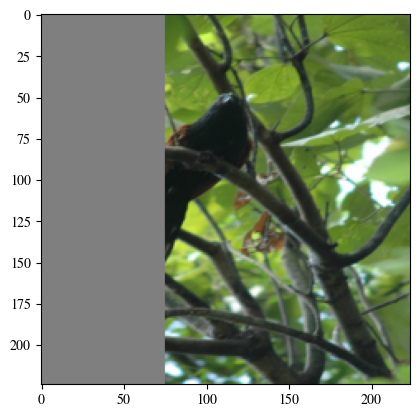

In [419]:
from PIL import Image
import matplotlib.pyplot as plt

alpha_k2_i5 = add_k_ones_enumerate(alpha, k=2)[5][None]
masked_image = image.to(device) * F.interpolate(alpha_k2_i5.to(device), size=(224, 224))

# plt.imshow(image[0].cpu().permute(1,2,0))
plt.imshow((masked_image[0].cpu().permute(1,2,0) + 1) /2)
raw_pred = wrapped_vit(image.cuda(), alpha_k2_i5[0]).argmax(-1).item()
set_random_seed(42)
smooth_pred = cert_mus_vit(image.cuda())['logits'].argmax(-1).item()
print(image.shape)
print('raw_pred', raw_vit.config.id2label[raw_pred])
print('smooth_pred', raw_vit.config.id2label[smooth_pred])

# get top_k predictions
top_k = 10
top_k_preds = get_top_k_predictions(wrapped_vit, 
                                    masked_image, raw_vit, k=top_k)

# Print the top k predictions
for rank, (label_id, label_name, logit, prob) in enumerate(top_k_preds, start=1):
    print(f"Rank {rank}: Label ID = {label_id}, Label = {label_name}, Logit = {logit:.4f}, Probability = {prob:.4f}")

In [406]:
# save masked images
for k in range(1, 6):
    print('k', k)
    try:
        alpha_add_k = add_k_ones_enumerate(alpha, k=k)
    except:
        alpha_add_k = torch.ones_like(alpha)
    # print(alpha_add_k.shape)
    for i, alpha_add in tqdm(enumerate(alpha_add_k)):
        vis_masked_img(image=image, alpha=alpha_add, 
            save_path=os.path.join(save_dir, 
                                  f'{exp_name}_alpha{alpha.sum().item()}_k{k}_i{i}.png'))

k 1


0it [00:00, ?it/s]

k 2


0it [00:00, ?it/s]

k 3


0it [00:00, ?it/s]

k 4


0it [00:00, ?it/s]

k 5


0it [00:00, ?it/s]